# 데이터셋 준비

In [1]:
!pip install pydicom

You should consider upgrading via the '/usr/bin/python3.8 -m pip install --upgrade pip' command.


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# IMA이미지를 불러오는 라이브러리
import pydicom

import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = [3.0, 3.0]
import seaborn as sns
import torch.nn as nn

In [3]:
root = '/root'

## 데이터셋 관련 (공통)

In [4]:
import glob

L_list = glob.glob(f'{root}/mayo2016/*')
L_list = [path.split('/')[-1] for path in L_list]
L_list.sort()
L_list

['L067',
 'L096',
 'L109',
 'L143',
 'L192',
 'L286',
 'L291',
 'L310',
 'L333',
 'L506']

In [5]:
data_label = ['quarter_1mm', 'full_1mm']

In [6]:
def normlize(path):
  dicom_data = pydicom.dcmread(path)
  img = dicom_data.pixel_array.astype(np.float32) * dicom_data.RescaleSlope + dicom_data.RescaleIntercept
  mu, sd = (-500,500)
  scaled_img = (img - mu) / sd
  img = np.expand_dims(scaled_img, axis=0)

  return img # 1x512x512

In [7]:
def extract_patches(img, patch_size=55, interval=55):
  patches = []
  _, height, width = img.shape
  for y in range(0, height - patch_size + 1, interval):
    for x in range(0, width - patch_size + 1, interval):
      patch = img[:, y:y + patch_size, x:x + patch_size]
      patches.append(patch)
  patches = np.array(patches)
  return patches # patch수x1x55x55, numpy

In [8]:
import random
from scipy.ndimage import rotate, zoom

def augment_patches(X_patches, y_patches, p=0.5):
    X_augmented_patches, y_augmented_patches = [], []

    # random이 들어가기에, X랑 y를 동시에 넣어준다.
    for i, (X_patch, y_patch) in enumerate(zip(X_patches, y_patches)):
        # 원본 패치 추가
        X_augmented_patches.append(X_patch)
        y_augmented_patches.append(y_patch)

        if random.random() < p:
            # 1. 90, 270으로 돌려보자.(뒤집기랑 조금 다르긴 하지만, 점대칭 vs 선대칭, 그냥 +-90도만 쓰자.)
            X, y = rotate(X_patch, 90, axes=(1, 2), reshape=False), rotate(y_patch, 90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
            X, y = rotate(X_patch, -90, axes=(1, 2), reshape=False), rotate(y_patch, -90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 2. 수직 뒤집기
            X,y = np.flip(X_patch, axis=1),np.flip(y_patch, axis=1)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 3. 수평 뒤집기
            X,y = np.flip(X_patch, axis=2),np.flip(y_patch, axis=2)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)

    return np.array(X_augmented_patches), np.array(y_augmented_patches)

In [9]:
def patch_maker_W_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  X_augmented_patches, y_augmented_patches = augment_patches(X_patches, y_patches, p=0.5)
  return X_augmented_patches, y_augmented_patches

In [10]:
def patch_maker_WO_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  return X_patches, y_patches

## biomedclip (추가된 부분)

In [11]:
!pip install torch torchvision transformers open_clip_torch

You should consider upgrading via the '/usr/bin/python3.8 -m pip install --upgrade pip' command.


In [12]:
import torch
from PIL import Image
from urllib.request import urlopen
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# 예제 이미지 및 텍스트
image_url = 'https://huggingface.co/microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224/resolve/main/example_data/biomed_image_classification_example_data/squamous_cell_carcinoma_histopathology.jpeg'
image = Image.open(urlopen(image_url))
texts = ['adenocarcinoma histopathology', 'squamous cell carcinoma histopathology']

# 이미지 및 텍스트 전처리
image_input = preprocess(image).unsqueeze(0).to(device)
text_input = tokenizer(texts).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(texts):
    print(f'{text}: {logits[0][i].item():.4f}')

adenocarcinoma histopathology: 0.0029
squamous cell carcinoma histopathology: 0.9971


In [15]:
text_descriptions = [
    # Head (두부)
    "brain",                # 뇌
    "skull",                # 두개골
    "cerebral hemispheres", # 대뇌 반구
    "ventricles",           # 뇌실
    "pituitary gland",      # 뇌하수체
    "sinuses",              # 부비동 (예: 상악동)

    # Chest (흉부)
    "lungs",                # 폐
    "heart",                # 심장
    "thoracic aorta",       # 흉부 대동맥
    "mediastinum",          # 종격동
    "bronchi",              # 기관지
    "ribs",                 # 갈비뼈

    # Abdomen (복부)
    "liver",                # 간
    "kidneys",              # 신장
    "pancreas",             # 췌장
    "spleen",               # 비장
    "abdominal aorta",      # 복부 대동맥
    "adrenal glands",       # 부신

    # 공통/기타
    "spine",                # 척추 (경추/흉추/요추 전체)
    "lymph nodes",          # 림프절
    "blood vessels"         # 혈관 (일반적 용어)
]

In [13]:
i,j = 0,0
L = L_list[i]
label = data_label[j]
dicom_files = glob.glob(f'{root}/mayo2016/{L}/{label}/*')
len(dicom_files)

560

In [14]:
import os
import pydicom
import numpy as np
import torch
from torchvision import transforms
from PIL import Image

# 이미지 불러오기
def load_dicom_image(dicom_path):
    dicom_data = pydicom.dcmread(dicom_path)
    img = dicom_data.pixel_array.astype(np.float32)

    # 정규화 (0~1 사이로)
    img = (img - img.min()) / (img.max() - img.min())
    img = (img * 255).astype(np.uint8)

    return Image.fromarray(img)

In [16]:
# 사용할 이미지
idx = 10
dicom_img = load_dicom_image(dicom_files[idx])
image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)

text_tokens = tokenizer(text_descriptions).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = model(image_tensor, text_tokens)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

brain: 0.0000
skull: 0.0000
cerebral hemispheres: 0.0000
ventricles: 0.0003
pituitary gland: 0.0000
sinuses: 0.0000
lungs: 0.9337
heart: 0.0000
thoracic aorta: 0.0002
mediastinum: 0.0534
bronchi: 0.0077
ribs: 0.0000
liver: 0.0001
kidneys: 0.0000
pancreas: 0.0000
spleen: 0.0030
abdominal aorta: 0.0000
adrenal glands: 0.0000
spine: 0.0015
lymph nodes: 0.0000
blood vessels: 0.0000


In [18]:
text_descriptions = [
    "skull",
    "ventricles",
    "lungs",
    "mediastinum",
    "liver",
    "kidneys",
    "pancreas",
    "spleen",
    "abdominal aorta",
    "spine",
    "lymph nodes"
]
len(text_descriptions)

11

## 데이터셋 정의

In [24]:
import pandas as pd

# organ_probs.csv 파일 불러오기
organ_probs_df = pd.read_csv(f"{root}/organ_probs.csv")
organ_probs_df.head(1)

,File_Path,skull,ventricles,lungs,mediastinum,liver,kidneys,pancreas,spleen,abdominal aorta,spine,lymph nodes
0,/content/drive/MyDrive/mayo2016/L067/quarter_1...,2.140607e-08,0.00043,0.978917,0.018699,0.000021,0.000003,0.000001,0.001919,2.020908e-07,0.000009,7.648957e-07


In [27]:
import os
from torch.utils.data import Dataset
import torch
import glob
from tqdm import tqdm

class CustomDataset(Dataset):
    def __init__(self, data_type, patch_maker, L_list, organ_probs_df):
        self.data_type = data_type
        self.patch_maker = patch_maker
        self.L_list = L_list
        self.organ_probs_df = organ_probs_df
        self.image_pairs = []

        X_dir_list, y_dir_list = [], []
        for L in self.L_list:
            X_dir, y_dir = self.get_data_range(L)
            X_dir_list += X_dir # 리스트 + 리스트 = 리스트
            y_dir_list += y_dir

        for i, (X_dir, y_dir) in tqdm(enumerate(zip(X_dir_list, y_dir_list)), total=len(X_dir_list), desc=f"{self.data_type} is processing"):
            X_patches, y_patches = self.patch_maker(X_dir, y_dir)
            organ_prob = torch.tensor([float(v) for v in organ_probs_df.iloc[i, 1:].values], dtype=torch.float32) # organ_prob을 tensor로 변환

            for j in range(X_patches.shape[0]):
                X_patch, y_patch = torch.from_numpy(X_patches[j]).float(), torch.from_numpy(y_patches[j]).float() # torch로 넣어주자.
                self.image_pairs.append((X_patch, organ_prob, y_patch))

    def get_data_range(self, L):
        """슬라이싱 범위를 설정하는 함수"""
        X_dir = sorted(glob.glob(f'{root}/mayo2016/{L}/{data_label[0]}/*.IMA'))
        y_dir = sorted(glob.glob(f'{root}/mayo2016/{L}/{data_label[1]}/*.IMA'))
        n1, n2 = len(X_dir), len(y_dir)

        if self.data_type == 'train':
            X_range = X_dir[:int(n1 * 0.64)]
            y_range = y_dir[:int(n2 * 0.64)]
        elif self.data_type == 'val':
            X_range = X_dir[int(n1 * 0.64):int(n1 * 0.8)]
            y_range = y_dir[int(n2 * 0.64):int(n2 * 0.8)]
        else:  # test
            X_range = X_dir[int(n1 * 0.8):]
            y_range = y_dir[int(n2 * 0.8):]

        return X_range, y_range

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        X = (self.image_pairs[idx][0], self.image_pairs[idx][1])
        y = self.image_pairs[idx][2]
        return X, y

In [29]:
# 파일 경로 설정

folder_name = f'{root}/dataset_add_prob/'
train_path = folder_name+'train_dataset.pt'
val_path = folder_name+'val_dataset.pt'
test_path = folder_name+'test_dataset.pt'

In [30]:
# 데이터셋 불러오기
train_dataset = torch.load(train_path) # , weights_only=False
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path)

In [31]:
batch_size = 16
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

In [32]:
len(train_loader), len(val_loader), len(test_loader)

(57631, 4815, 6025)

# moanet - uniform

## 학습준비

In [144]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7, num_organs=11, prob_mode="base"):
        """
        Args:
            kernel_size (int): 컨볼루션 커널 크기 (3 또는 7)
            num_organs (int): 장기 개수
            prob_mode (str): "uniform" 또는 "random" (organ_prob을 변환하는 방식)
        """
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), "Kernel size must be 3 or 7"
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, num_organs, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()
        self.last_attention = None  
        self.prob_mode = prob_mode  # "base", "uniform", "random" 선택

    def forward(self, x, organ_prob):
        """
        Args:
            x (torch.Tensor): Input feature map [B, C, H, W]
            organ_prob (torch.Tensor): Organ probability vector [B, num_organs]
        Returns:
            torch.Tensor: Attention-weighted feature map [B, C, H, W]
        """
        B, C, H, W = x.shape  

        # ---- [Step 1] organ_prob 변환 ---- #
        if self.prob_mode == "uniform":
            organ_prob = torch.full_like(organ_prob, 1 / organ_prob.shape[1])  # 동일한 확률
        elif self.prob_mode == "random":
            random_prob = torch.rand_like(organ_prob)  # 랜덤 값 생성
            organ_prob = random_prob / random_prob.sum(dim=1, keepdim=True)  # 합이 1이 되도록 정규화

        # ---- [Step 2] 채널 차원 압축 (Max & Avg Pooling) ---- #
        avg_out = torch.mean(x, dim=1, keepdim=True)  
        max_out, _ = torch.max(x, dim=1, keepdim=True)  
        combined = torch.cat([avg_out, max_out], dim=1)  

        # ---- [Step 3] 2D Conv 적용 ---- #
        attention = self.sigmoid(self.conv(combined))  
        self.last_attention = attention  

        # ---- [Step 4] organ_prob과 attention 결합 ---- #
        organ_prob = organ_prob.view(B, -1, 1, 1)  
        weighted_attention = attention * organ_prob  

        # ---- [Step 5] 최종 Attention Map 생성 및 적용 ---- #
        final_attention = torch.sum(weighted_attention, dim=1, keepdim=True)  
        output = x * final_attention  

        return output


In [145]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [146]:
class RedCNNWithSpatialAttention(nn.Module):
    def __init__(self):
        super(RedCNNWithSpatialAttention, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)

        # Spatial Attention Blocks
        self.spatial_attention3 = SpatialAttention(prob_mode="uniform")
        self.spatial_attention5 = SpatialAttention(prob_mode="uniform")

        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()

    def forward(self, x, prob):
        # 인코더 부분
        residual1 = x
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x
        x = self.relu(self.conv3(x))
        x = self.spatial_attention3(x, prob)  # Spatial Attention (3번째 위치)
        x = self.relu(self.conv4(x))
        residual3 = x
        x = self.relu(self.conv5(x))
        x = self.spatial_attention5(x, prob)  # Spatial Attention (5번째 위치)

        # 디코더 부분
        x = self.relu(self.deconv1(x) + residual3)
        x = self.relu(self.deconv2(x))
        x = self.relu(self.deconv3(x) + residual2)
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1

        return x

In [147]:
model = RedCNNWithSpatialAttention().to(device)
model


RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), 

In [148]:
%cd {root}

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root


<module 'utils.train_eval_util' from '/root/utils/train_eval_util.py'>

In [149]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [ ]:
# first_batch = next(iter(train_loader))
# (X,prob),y = first_batch
# X.shape, prob.shape, y.shape

(torch.Size([16, 1, 55, 55]),
 torch.Size([16, 11]),
 torch.Size([16, 1, 55, 55]))

In [152]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0.0  # ✅ 초기화

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        batch_loss = loss.item() * X.size(0)  # ✅ 배치별 손실 계산
        total_loss += batch_loss  # ✅ 모든 배치 손실 누적
        running_loss += batch_loss  # interval 내 손실 누적

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)  # ✅ 평균 손실 반환

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0.0  # ✅ 초기화

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
            X_hat = model(X, prob)
            loss = criterion(X_hat, y)

            batch_loss = loss.item() * X.size(0)  # ✅ 배치별 손실 계산
            total_loss += batch_loss  # ✅ 모든 배치 손실 누적
            running_loss += batch_loss  # interval 내 손실 누적

            if i % interval == interval - 1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                running_loss = 0.0
                tqdm.write(f'val loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)  # ✅ 평균 손실 반환


# 학습

In [153]:
!pwd

/root


In [154]:
%cd {root}/moanet_weight/uniform

/root/moanet_weight/uniform


In [155]:
epochs = 1 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'moanet_uniform' + ".pth")
    if (early_stopping(valid_loss)):
        break

Epoch 0 - Training:   2%|▏         | 1016/57631 [00:10<09:46, 96.60it/s]

train loss : 0.0860297485627234


Epoch 0 - Training:   3%|▎         | 2010/57631 [00:21<10:09, 91.23it/s] 

train loss : 0.058874370934441686


Epoch 0 - Training:   5%|▌         | 3013/57631 [00:32<09:45, 93.24it/s] 

train loss : 0.0531187338475138


Epoch 0 - Training:   7%|▋         | 4008/57631 [00:42<09:52, 90.54it/s] 

train loss : 0.05089981634542346


Epoch 0 - Training:   9%|▊         | 5010/57631 [00:53<09:49, 89.24it/s]

train loss : 0.04861872117221355


Epoch 0 - Training:  10%|█         | 6016/57631 [01:04<09:20, 92.13it/s] 

train loss : 0.04801337821781635


Epoch 0 - Training:  12%|█▏        | 7011/57631 [01:15<09:20, 90.24it/s] 

train loss : 0.04705244777910411


Epoch 0 - Training:  14%|█▍        | 8015/57631 [01:26<08:52, 93.17it/s] 

train loss : 0.04589146456681192


Epoch 0 - Training:  16%|█▌        | 9012/57631 [01:36<08:55, 90.78it/s] 

train loss : 0.04451217810250819


Epoch 0 - Training:  17%|█▋        | 10018/57631 [01:47<08:25, 94.12it/s]

train loss : 0.044340373814105986


Epoch 0 - Training:  19%|█▉        | 11013/57631 [01:58<08:32, 90.91it/s] 

train loss : 0.043653568567708134


Epoch 0 - Training:  21%|██        | 12015/57631 [02:10<09:17, 81.87it/s] 

train loss : 0.04398725213110447


Epoch 0 - Training:  23%|██▎       | 13014/57631 [02:21<07:53, 94.31it/s]

train loss : 0.042310480881482364


Epoch 0 - Training:  24%|██▍       | 14014/57631 [02:31<07:50, 92.71it/s] 

train loss : 0.04217247350141406


Epoch 0 - Training:  26%|██▌       | 15017/57631 [02:42<07:51, 90.45it/s] 

train loss : 0.04168971099331975


Epoch 0 - Training:  28%|██▊       | 16014/57631 [02:52<07:01, 98.83it/s] 

train loss : 0.04128133792243898


Epoch 0 - Training:  30%|██▉       | 17012/57631 [03:03<07:14, 93.48it/s]

train loss : 0.0416382217630744


Epoch 0 - Training:  31%|███▏      | 18014/57631 [03:13<06:55, 95.27it/s] 

train loss : 0.04096677820757032


Epoch 0 - Training:  33%|███▎      | 19010/57631 [03:24<06:23, 100.75it/s]

train loss : 0.040783512361347675


Epoch 0 - Training:  35%|███▍      | 20010/57631 [03:34<06:52, 91.21it/s] 

train loss : 0.04065629328228533


Epoch 0 - Training:  36%|███▋      | 21011/57631 [03:44<06:39, 91.75it/s] 

train loss : 0.04024881348386407


Epoch 0 - Training:  38%|███▊      | 22009/57631 [03:55<06:23, 92.90it/s] 

train loss : 0.03972985946200788


Epoch 0 - Training:  40%|███▉      | 23016/57631 [04:05<06:11, 93.16it/s] 

train loss : 0.04072394486889243


Epoch 0 - Training:  42%|████▏     | 24009/57631 [04:16<05:48, 96.39it/s] 

train loss : 0.039516174744814635


Epoch 0 - Training:  43%|████▎     | 25012/57631 [04:26<05:28, 99.30it/s]

train loss : 0.0392313537877053


Epoch 0 - Training:  45%|████▌     | 26018/57631 [04:37<05:19, 98.81it/s] 

train loss : 0.03931130597926676


Epoch 0 - Training:  47%|████▋     | 27014/57631 [04:48<05:34, 91.65it/s] 

train loss : 0.039153405476361515


Epoch 0 - Training:  49%|████▊     | 28017/57631 [04:58<05:04, 97.29it/s] 

train loss : 0.039432901363819835


Epoch 0 - Training:  50%|█████     | 29012/57631 [05:09<05:18, 89.75it/s] 

train loss : 0.03868016184307635


Epoch 0 - Training:  52%|█████▏    | 30017/57631 [05:20<04:36, 99.85it/s] 

train loss : 0.03854465946741402


Epoch 0 - Training:  54%|█████▍    | 31009/57631 [05:30<04:56, 89.76it/s] 

train loss : 0.03889172282256186


Epoch 0 - Training:  56%|█████▌    | 32022/57631 [05:41<04:06, 103.96it/s]

train loss : 0.03900942881405354


Epoch 0 - Training:  57%|█████▋    | 33001/57631 [05:54<05:16, 77.77it/s] 

train loss : 0.03834265516512096


Epoch 0 - Training:  59%|█████▉    | 34016/57631 [06:10<04:04, 96.70it/s] 

train loss : 0.03812490022927523


Epoch 0 - Training:  61%|██████    | 35013/57631 [06:21<04:04, 92.50it/s] 

train loss : 0.0376870134100318


Epoch 0 - Training:  62%|██████▏   | 36010/57631 [06:31<03:46, 95.36it/s] 

train loss : 0.038488674143329266


Epoch 0 - Training:  64%|██████▍   | 37010/57631 [06:42<03:44, 91.66it/s] 

train loss : 0.03866877900622785


Epoch 0 - Training:  66%|██████▌   | 38015/57631 [06:53<03:30, 93.00it/s] 

train loss : 0.03808653511293232


Epoch 0 - Training:  68%|██████▊   | 39011/57631 [07:04<03:17, 94.25it/s]

train loss : 0.0384212093744427


Epoch 0 - Training:  69%|██████▉   | 40013/57631 [07:15<03:12, 91.50it/s] 

train loss : 0.03771404456719756


Epoch 0 - Training:  71%|███████   | 41009/57631 [07:26<02:58, 93.37it/s]

train loss : 0.03771412618272006


Epoch 0 - Training:  73%|███████▎  | 42014/57631 [07:36<02:46, 93.62it/s] 

train loss : 0.03784517431259155


Epoch 0 - Training:  75%|███████▍  | 43011/57631 [07:47<02:38, 92.50it/s] 

train loss : 0.03808778955973685


Epoch 0 - Training:  76%|███████▋  | 44017/57631 [07:58<02:34, 88.32it/s] 

train loss : 0.03800437591969967


Epoch 0 - Training:  78%|███████▊  | 45014/57631 [08:09<02:19, 90.31it/s] 

train loss : 0.037374893935397266


Epoch 0 - Training:  80%|███████▉  | 46017/57631 [08:19<02:05, 92.20it/s]

train loss : 0.03802402602136135


Epoch 0 - Training:  82%|████████▏ | 47011/57631 [08:30<01:45, 100.50it/s]

train loss : 0.03720458247605711


Epoch 0 - Training:  83%|████████▎ | 48010/57631 [08:41<01:44, 91.96it/s] 

train loss : 0.037835031401365994


Epoch 0 - Training:  85%|████████▌ | 49010/57631 [08:51<01:35, 90.16it/s]

train loss : 0.03737827805057168


Epoch 0 - Training:  87%|████████▋ | 50017/57631 [09:02<01:23, 91.64it/s] 

train loss : 0.037683908361941576


Epoch 0 - Training:  89%|████████▊ | 51015/57631 [09:13<01:06, 99.51it/s] 

train loss : 0.03694717901572585


Epoch 0 - Training:  90%|█████████ | 52010/57631 [09:23<01:01, 91.70it/s] 

train loss : 0.037032089041545986


Epoch 0 - Training:  92%|█████████▏| 53016/57631 [09:34<00:50, 92.26it/s] 

train loss : 0.03739877511933446


Epoch 0 - Training:  94%|█████████▎| 54009/57631 [09:45<00:40, 89.86it/s]

train loss : 0.03681053087487817


Epoch 0 - Training:  95%|█████████▌| 55016/57631 [09:55<00:26, 97.92it/s] 

train loss : 0.03684035450965166


Epoch 0 - Training:  97%|█████████▋| 56010/57631 [10:06<00:16, 96.16it/s]

train loss : 0.03705515536200255


Epoch 0 - Training:  99%|█████████▉| 57013/57631 [10:17<00:06, 92.27it/s] 

train loss : 0.0370139486566186


Epoch 0 - Evaluating:  22%|██▏       | 1063/4815 [00:03<00:11, 340.43it/s]

val loss : 0.04251541835442185


Epoch 0 - Evaluating:  43%|████▎     | 2063/4815 [00:05<00:07, 345.72it/s]

val loss : 0.046143093619961294


Epoch 0 - Evaluating:  63%|██████▎   | 3047/4815 [00:09<00:05, 330.36it/s]

val loss : 0.030350229516392574


Epoch 0 - Evaluating:  84%|████████▍ | 4041/4815 [00:12<00:02, 313.63it/s]

val loss : 0.03388670407375321


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:16<00:00, 291.31it/s]

Epoch [1/1], Train Loss: 0.0026, Valid Loss: 0.0023



/usr/local/lib/python3.8/dist-packages/torch/nn/modules/module.py:1383: UserWarning: positional arguments and argument "destination" are deprecated. nn.Module.state_dict will not accept them in the future. Refer to https://pytorch.org/docs/master/generated/torch.nn.Module.html#torch.nn.Module.state_dict for details.
  warnings.warn(


In [156]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [157]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [158]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

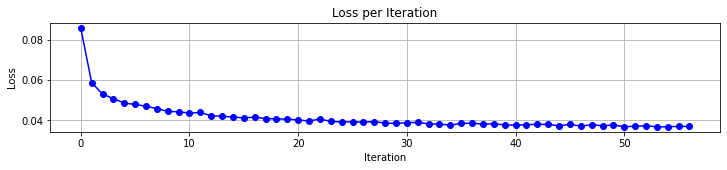

In [159]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

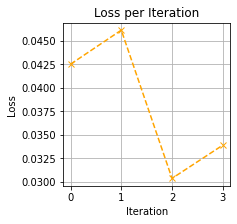

In [160]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

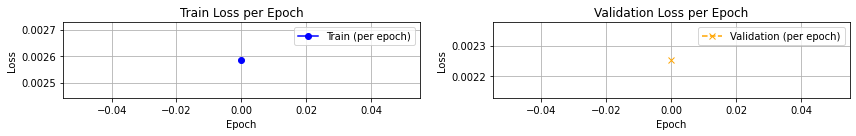

In [161]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [168]:
!pwd

/root/moanet_weight/uniform


In [169]:
%cd {root}/moanet_weight/uniform

/root/moanet_weight/uniform


In [170]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [171]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('moanet_uniform.pth'))

<All keys matched successfully>

In [172]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
len(test_loader)

6025

In [173]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  17%|█▋        | 1052/6025 [00:03<00:16, 303.19it/s]

train loss : 0.03714063870394602


Evaluating:  34%|███▍      | 2056/6025 [00:06<00:11, 345.37it/s]

train loss : 0.03441855502035469


Evaluating:  51%|█████     | 3060/6025 [00:09<00:08, 347.25it/s]

train loss : 0.035655468882061545


Evaluating:  67%|██████▋   | 4037/6025 [00:12<00:06, 308.84it/s]

train loss : 0.02506992655945942


Evaluating:  84%|████████▎ | 5034/6025 [00:15<00:03, 302.85it/s]

train loss : 0.024685759253567086


Evaluating: 100%|█████████▉| 6021/6025 [00:18<00:00, 313.05it/s]

train loss : 0.022710311881499363


Evaluating: 100%|██████████| 6025/6025 [00:19<00:00, 305.46it/s]


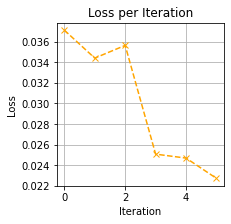

In [174]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [175]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)

        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)

        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [176]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [177]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    (X_test,prob), y_test = next(test_iter)

In [178]:
prob.shape

torch.Size([16, 11])

In [179]:
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda(),prob.cuda()).cpu().detach()).numpy() * 500 - 500

In [180]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

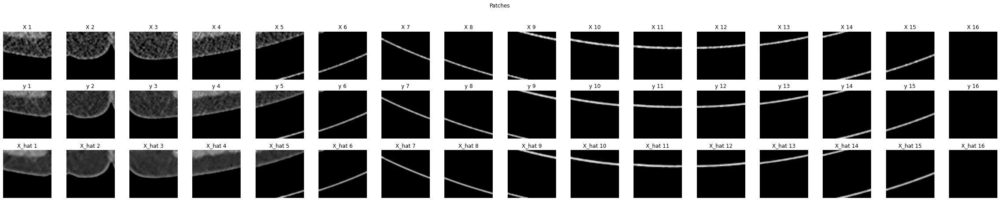

In [181]:
visualize_patches_total(X, y, X_hat)

In [182]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(X_hat.cpu().numpy()) * 500 - 500

In [183]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

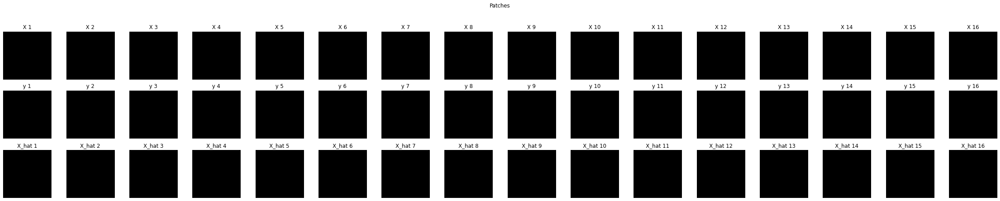

In [184]:
visualize_patches_total(X, y, X_hat)

In [185]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(X_hat.cpu().numpy()) * 500 - 500

In [186]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

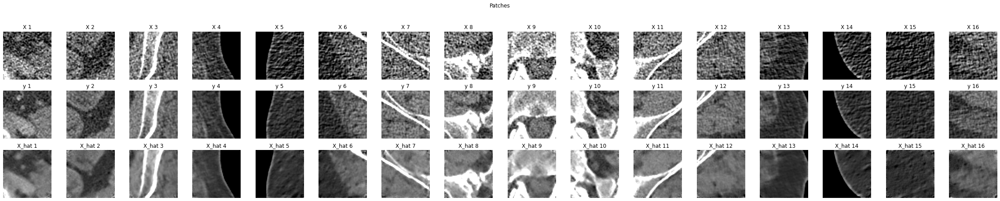

In [187]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [188]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('moanet_uniform.pth'))

<All keys matched successfully>

In [189]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=4, pin_memory=True)
len(test_loader)

1190

In [190]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  85%|████████▍ | 1007/1190 [00:16<00:02, 62.92it/s]

train loss : 0.15868699673423545


Evaluating: 100%|██████████| 1190/1190 [00:19<00:00, 59.92it/s]


### 함수정의

In [191]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."

    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)

    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호

        # 패치를 해당 위치에 붙이기
        final_image[:,
                    row * patch_size:(row + 1) * patch_size,
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [192]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [193]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [194]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [195]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1862.))

In [196]:
!pwd

/root/moanet_weight/uniform


In [197]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)

    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)

    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

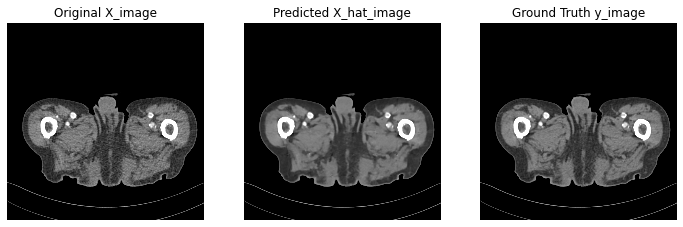

In [198]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [199]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

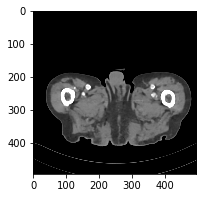

In [200]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

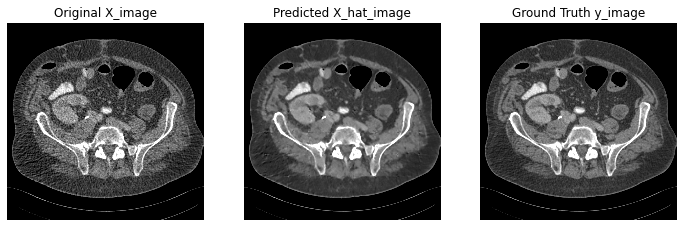

In [201]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [202]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [203]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

In [204]:
import torch
from PIL import Image
from urllib.request import urlopen
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

# 사용할 이미지
dicom_img = load_dicom_image(X_dir)
image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)
text_tokens = tokenizer(text_descriptions).to(device)

# 이미지 및 텍스트 전처리
image_input = preprocess(image).unsqueeze(0).to(device)
text_input = tokenizer(texts).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_tokens)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

In [205]:
prob.shape

torch.Size([81, 11])

In [206]:
logits.shape

torch.Size([1, 11])

In [207]:
X_patches.shape

torch.Size([81, 1, 55, 55])

In [208]:
expanded_logits = logits.expand(81, -1)  # shape: [81, 11]
expanded_logits.shape

torch.Size([81, 11])

In [209]:
X_hat = model(X_patches.cuda(),expanded_logits.cuda())
X_hat.shape

torch.Size([81, 1, 55, 55])

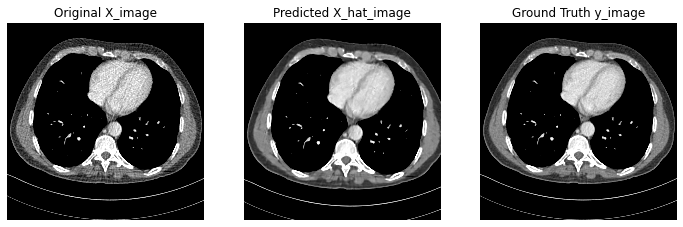

In [210]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_hat.detach().cpu()))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [211]:
!pwd

/root/moanet_weight/uniform


In [212]:
def recreat(X_dir):

    # X_patches
    X_img = normlize(X_dir)
    X_patches = extract_patches(torch.from_numpy(X_img))
    # prob
    dicom_img = load_dicom_image(X_dir)
    image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)
    text_tokens = tokenizer(text_descriptions).to(device)
    image_input = preprocess(image).unsqueeze(0).to(device)
    text_input = tokenizer(texts).to(device)
    with torch.no_grad():
        image_features, text_features, logit_scale = clip_model(image_input, text_tokens)
        logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)
    expanded_logits = logits.expand(81, -1)
    # X_hat
    X_hat = model(X_patches.cuda(),expanded_logits.cuda())

    return reconstruct_image(X_hat.detach().cpu())

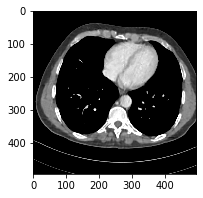

In [213]:
plt.imshow(rescale(np.squeeze(recreat(X_dir))), cmap='gray', vmin=-200, vmax=300)

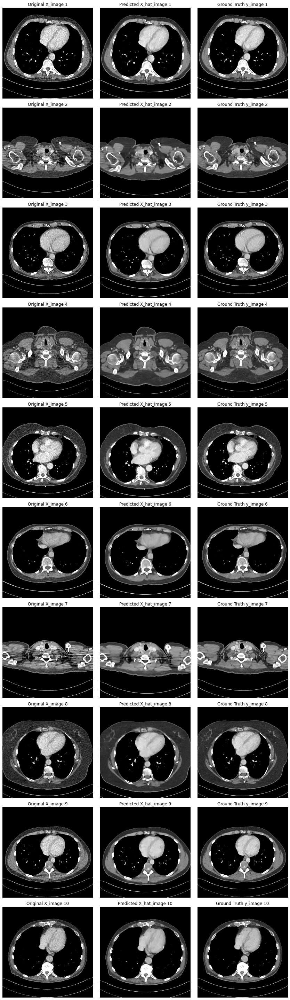

In [214]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    reconstructed_image = recreat(X_dir)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [215]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('moanet_uniform.pth'))
model.eval()

RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), 

## best / worst 이미지의 attention 확인

### 함수정의

In [216]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치

    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)

    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호

        # 패치를 해당 위치에 붙이기
        final_image[:,
                    row * patch_size:(row + 1) * patch_size,
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [217]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [218]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [219]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

### 1. best

In [220]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [221]:
reconstruct_image(X_test).shape

torch.Size([1, 495, 495])

In [222]:
import torch
import torch.nn.functional as F
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

image_tensor = reconstruct_image(X_test) # torch.Size([1, 495, 495])

# 텍스트
text_input = tokenizer(text_descriptions).to(device)

# Tensor를 BiomedCLIP이 처리할 수 있는 형태로 변환
def preprocess_tensor(img_tensor):
    # 1채널 → 3채널 (Grayscale → RGB)
    img_tensor = img_tensor.repeat(1, 3, 1, 1)  # (81, 1, 55, 55) → (81, 3, 55, 55)

    # 크기 조정 (55x55 → 224x224)
    img_tensor = F.interpolate(img_tensor, size=(224, 224), mode="bilinear", align_corners=False)

    return img_tensor

# 이미지 변환 후 BiomedCLIP 입력
image_input = preprocess_tensor(image_tensor).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

skull: 0.0010
ventricles: 0.3819
lungs: 0.5868
mediastinum: 0.0161
liver: 0.0002
kidneys: 0.0011
pancreas: 0.0000
spleen: 0.0096
abdominal aorta: 0.0027
spine: 0.0000
lymph nodes: 0.0006


In [223]:
logits_list = logits.squeeze(0)
logits_list.shape, logits_list.sum()

(torch.Size([11]), tensor(1., device='cuda:0'))

In [224]:
# prob
expanded_logits = logits.expand(81, -1)
expanded_logits.shape

torch.Size([81, 11])

In [225]:
X_test.shape, expanded_logits.shape

(torch.Size([81, 1, 55, 55]), torch.Size([81, 11]))

In [226]:
X_test.to(device)
output = model(X_test.cuda(), expanded_logits.cuda())
output.shape

torch.Size([81, 1, 55, 55])

In [227]:
# Forward Pass
output = model(X_test, expanded_logits)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 11, 43, 43]), torch.Size([81, 11, 35, 35]))

여기서부터 시각화 확인

In [228]:
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_3.shape

torch.Size([81, 1, 43, 43])

In [229]:
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix3_img.shape

torch.Size([1, 387, 387])

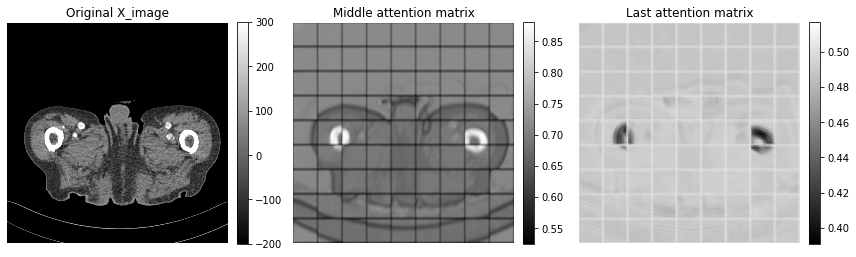

In [230]:
# 0번째 장기에 대한 attention
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

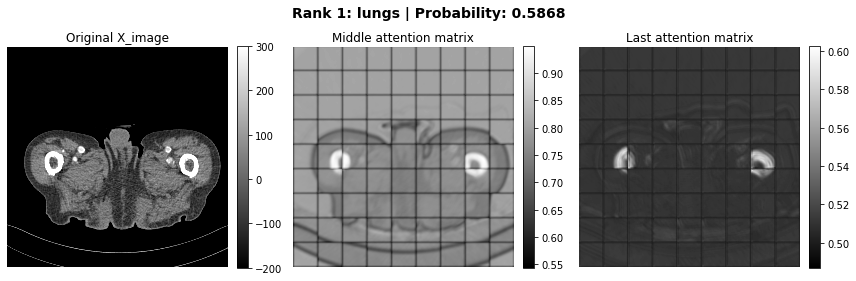

Saved: /root/output_images/uniform/best/rank_1_lungs.png


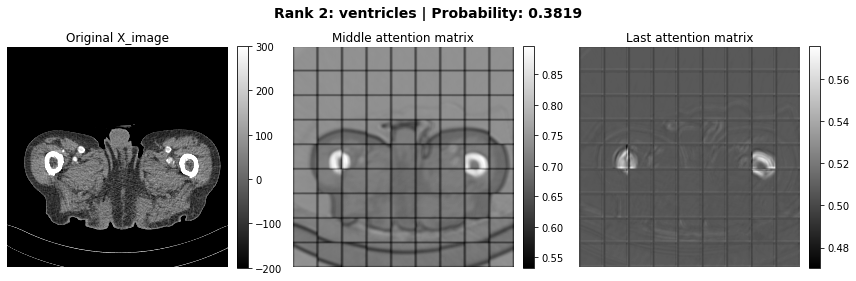

Saved: /root/output_images/uniform/best/rank_2_ventricles.png


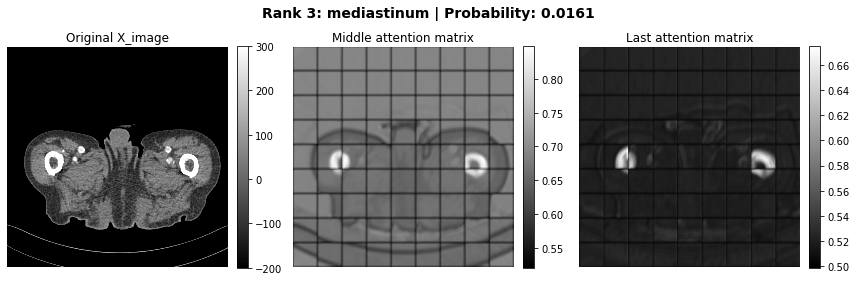

Saved: /root/output_images/uniform/best/rank_3_mediastinum.png


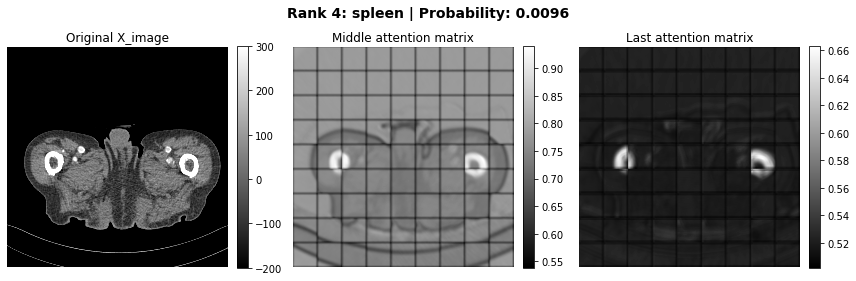

Saved: /root/output_images/uniform/best/rank_4_spleen.png


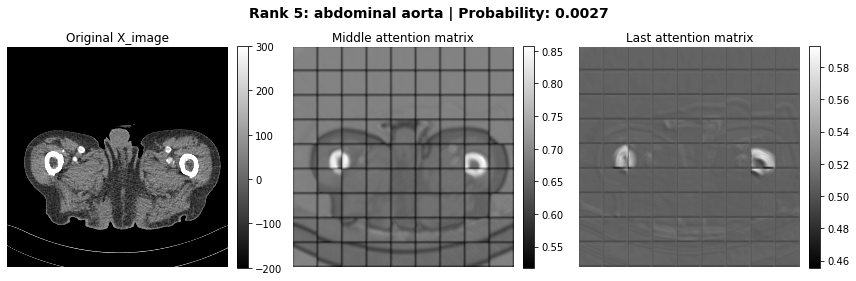

Saved: /root/output_images/uniform/best/rank_5_abdominal aorta.png


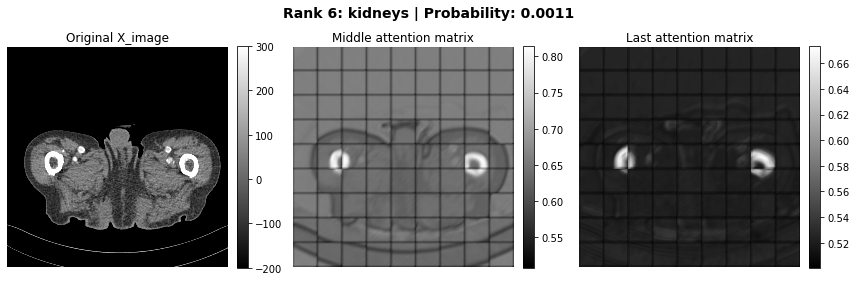

Saved: /root/output_images/uniform/best/rank_6_kidneys.png


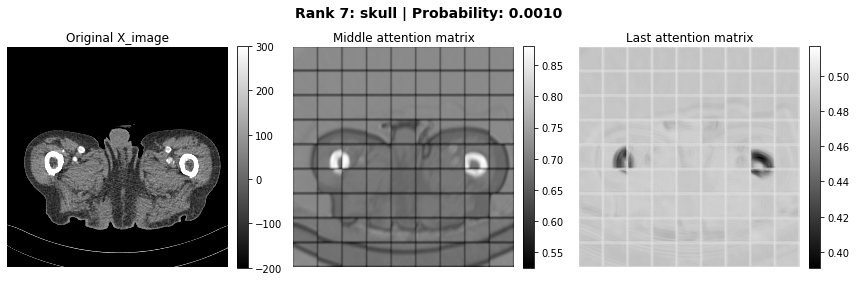

Saved: /root/output_images/uniform/best/rank_7_skull.png


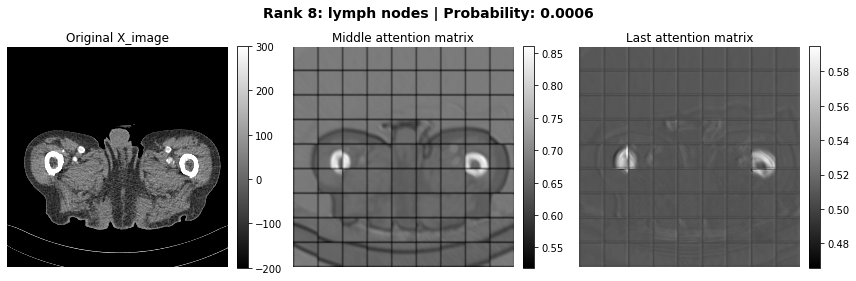

Saved: /root/output_images/uniform/best/rank_8_lymph nodes.png


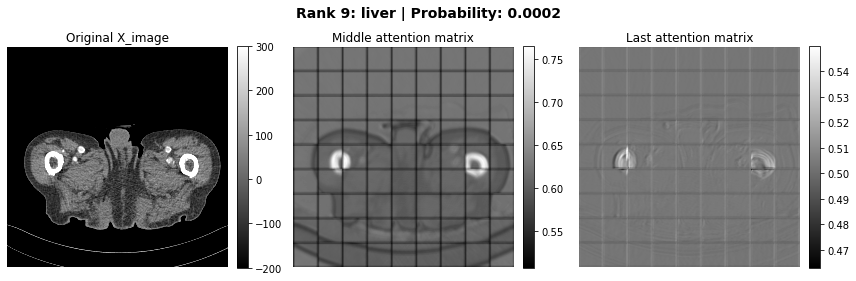

Saved: /root/output_images/uniform/best/rank_9_liver.png


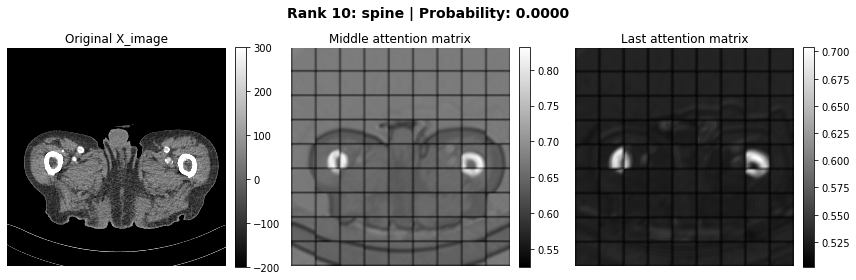

Saved: /root/output_images/uniform/best/rank_10_spine.png


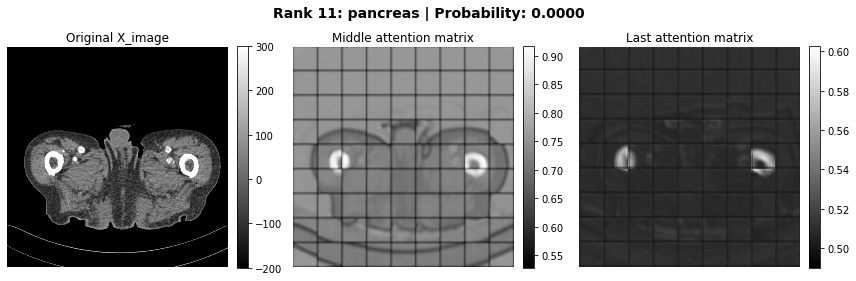

Saved: /root/output_images/uniform/best/rank_11_pancreas.png


In [231]:
import os

# 저장할 폴더 생성
save_dir = f"{root}/output_images/uniform/best"
os.makedirs(save_dir, exist_ok=True)

# 확률이 높은 순으로 정렬
sorted_indices = torch.argsort(logits_list, descending=True)  # 높은 확률 순으로 정렬
sorted_probs = logits_list[sorted_indices]  # 정렬된 확률값
sorted_organs = [text_descriptions[i] for i in sorted_indices]  # 정렬된 장기 이름

for rank, i in enumerate(sorted_indices):  # 정렬된 순서대로 반복
    selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
    selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)

    att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
    att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

    organ_name = sorted_organs[rank]  # 현재 장기 이름
    probability = sorted_probs[rank].item()  # 현재 장기에 대한 확률

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"Rank {rank+1}: {organ_name} | Probability: {probability:.4f}", fontsize=14, fontweight='bold')

    # 첫 번째 이미지
    im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
    axes[0].set_title("Original X_image")
    axes[0].axis('off')
    fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

    # 두 번째 이미지
    im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
    axes[1].set_title(f"Middle attention matrix")
    axes[1].axis('off')
    fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

    # 세 번째 이미지
    im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
    axes[2].set_title(f"Last attention matrix")
    axes[2].axis('off')
    fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()

    # 이미지 저장
    save_path = os.path.join(save_dir, f"rank_{rank+1}_{organ_name}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved: {save_path}")

### 2. worst

In [232]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [233]:
reconstruct_image(X_test).shape

torch.Size([1, 495, 495])

In [234]:
import torch
import torch.nn.functional as F
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

image_tensor = reconstruct_image(X_test) # torch.Size([1, 495, 495])

# 텍스트
text_input = tokenizer(text_descriptions).to(device)

# Tensor를 BiomedCLIP이 처리할 수 있는 형태로 변환
def preprocess_tensor(img_tensor):
    # 1채널 → 3채널 (Grayscale → RGB)
    img_tensor = img_tensor.repeat(1, 3, 1, 1)  # (81, 1, 55, 55) → (81, 3, 55, 55)

    # 크기 조정 (55x55 → 224x224)
    img_tensor = F.interpolate(img_tensor, size=(224, 224), mode="bilinear", align_corners=False)

    return img_tensor

# 이미지 변환 후 BiomedCLIP 입력
image_input = preprocess_tensor(image_tensor).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

skull: 0.0032
ventricles: 0.0225
lungs: 0.0024
mediastinum: 0.1097
liver: 0.0001
kidneys: 0.0114
pancreas: 0.0000
spleen: 0.0034
abdominal aorta: 0.0054
spine: 0.8415
lymph nodes: 0.0003


In [235]:
logits_list = logits.squeeze(0)
logits_list.shape, logits_list.sum()

(torch.Size([11]), tensor(1.0000, device='cuda:0'))

In [236]:
# prob
expanded_logits = logits.expand(81, -1)
expanded_logits.shape

torch.Size([81, 11])

In [237]:
X_test.shape, expanded_logits.shape

(torch.Size([81, 1, 55, 55]), torch.Size([81, 11]))

In [238]:
X_test.to(device)
output = model(X_test.cuda(), expanded_logits.cuda())
output.shape

torch.Size([81, 1, 55, 55])

In [239]:
# Forward Pass
output = model(X_test, expanded_logits)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 11, 43, 43]), torch.Size([81, 11, 35, 35]))

여기서부터 시각화 확인

In [240]:
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_3.shape

torch.Size([81, 1, 43, 43])

In [241]:
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix3_img.shape

torch.Size([1, 387, 387])

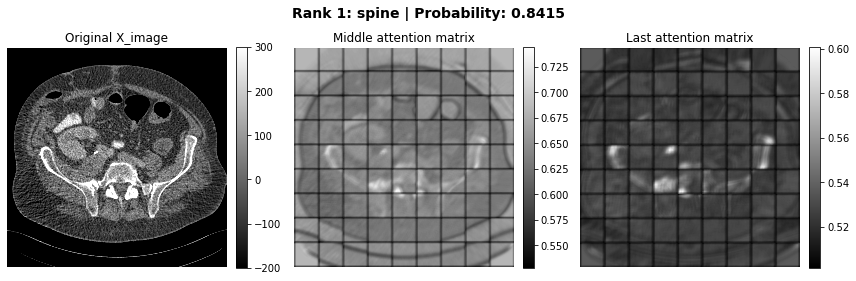

Saved: /root/output_images/uniform/worst/rank_1_spine.png


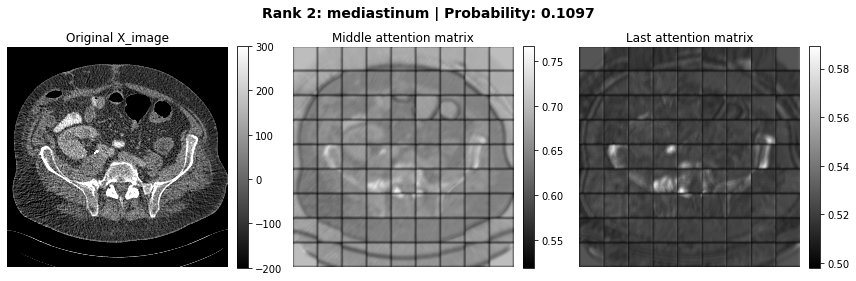

Saved: /root/output_images/uniform/worst/rank_2_mediastinum.png


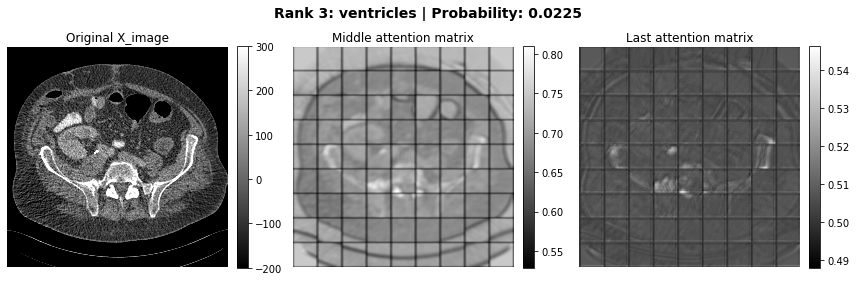

Saved: /root/output_images/uniform/worst/rank_3_ventricles.png


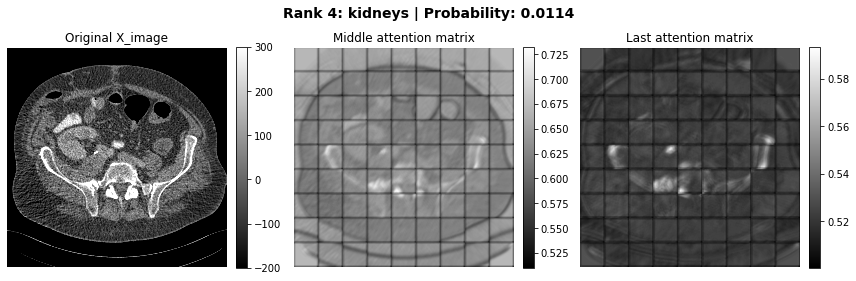

Saved: /root/output_images/uniform/worst/rank_4_kidneys.png


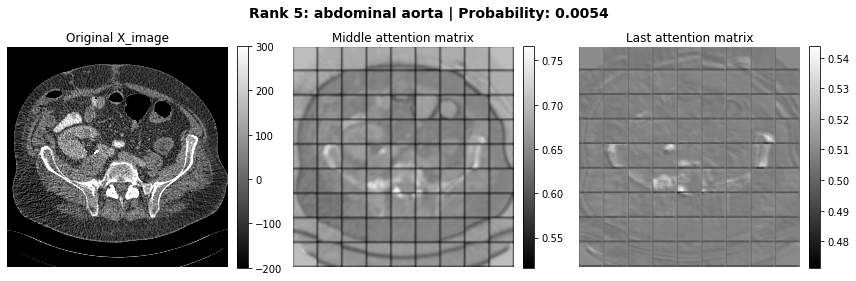

Saved: /root/output_images/uniform/worst/rank_5_abdominal aorta.png


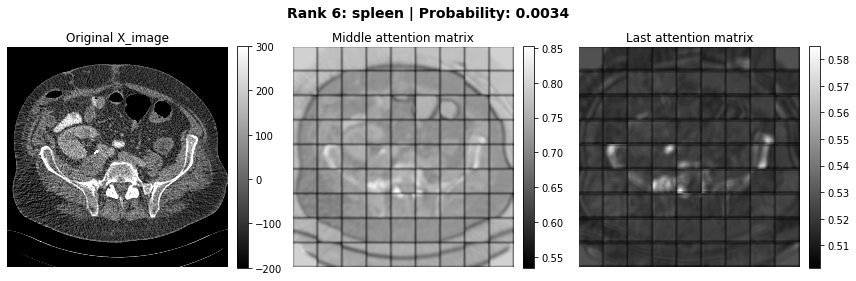

Saved: /root/output_images/uniform/worst/rank_6_spleen.png


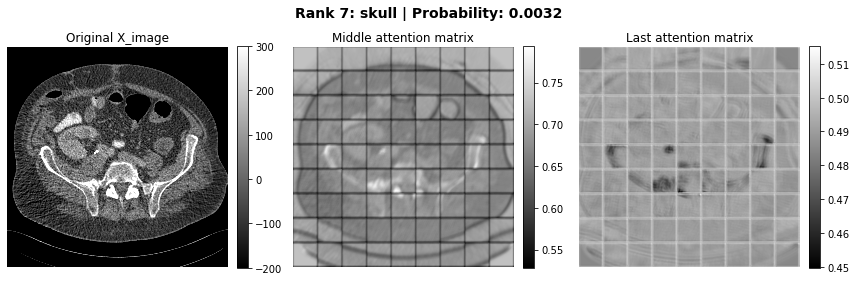

Saved: /root/output_images/uniform/worst/rank_7_skull.png


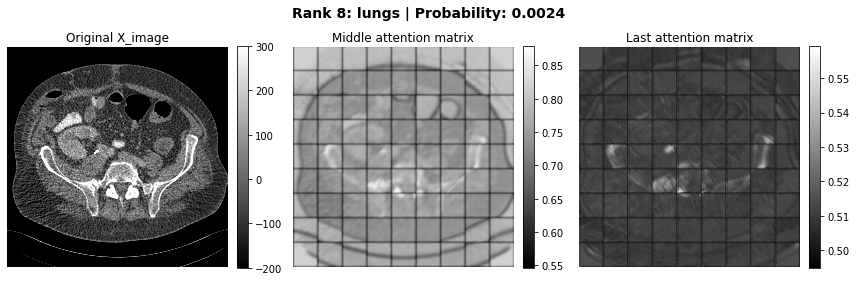

Saved: /root/output_images/uniform/worst/rank_8_lungs.png


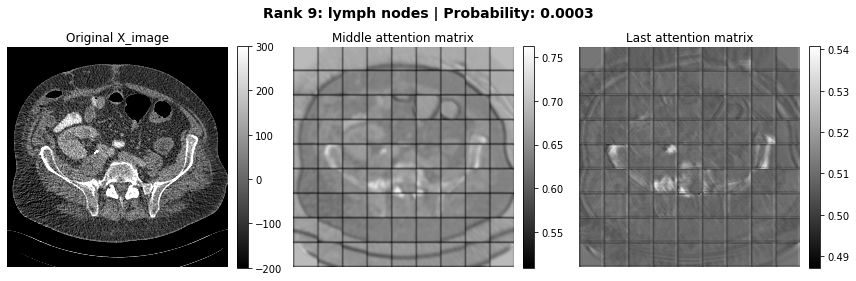

Saved: /root/output_images/uniform/worst/rank_9_lymph nodes.png


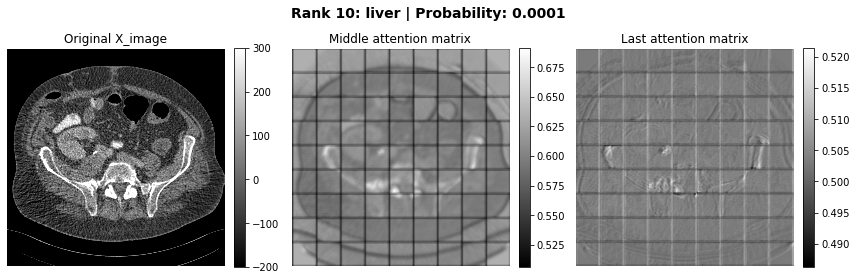

Saved: /root/output_images/uniform/worst/rank_10_liver.png


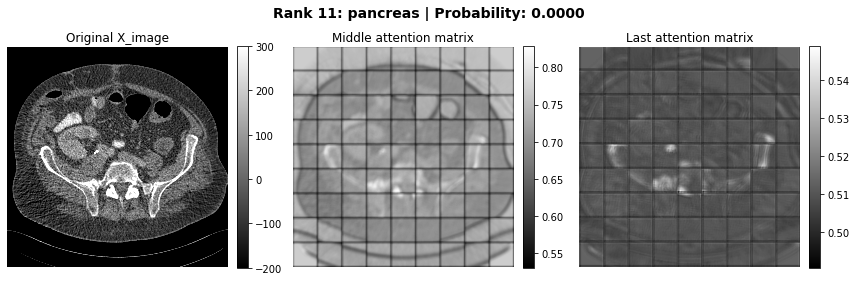

Saved: /root/output_images/uniform/worst/rank_11_pancreas.png


In [242]:
import os

# 저장할 폴더 생성
save_dir = f"{root}/output_images/uniform/worst"
os.makedirs(save_dir, exist_ok=True)

# 확률이 높은 순으로 정렬
sorted_indices = torch.argsort(logits_list, descending=True)  # 높은 확률 순으로 정렬
sorted_probs = logits_list[sorted_indices]  # 정렬된 확률값
sorted_organs = [text_descriptions[i] for i in sorted_indices]  # 정렬된 장기 이름

for rank, i in enumerate(sorted_indices):  # 정렬된 순서대로 반복
    selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
    selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)

    att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
    att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

    organ_name = sorted_organs[rank]  # 현재 장기 이름
    probability = sorted_probs[rank].item()  # 현재 장기에 대한 확률

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"Rank {rank+1}: {organ_name} | Probability: {probability:.4f}", fontsize=14, fontweight='bold')

    # 첫 번째 이미지
    im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
    axes[0].set_title("Original X_image")
    axes[0].axis('off')
    fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

    # 두 번째 이미지
    im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
    axes[1].set_title(f"Middle attention matrix")
    axes[1].axis('off')
    fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

    # 세 번째 이미지
    im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
    axes[2].set_title(f"Last attention matrix")
    axes[2].axis('off')
    fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()

    # 이미지 저장
    save_path = os.path.join(save_dir, f"rank_{rank+1}_{organ_name}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved: {save_path}")

# moanet - random

## 학습준비

In [243]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7, num_organs=11, prob_mode="base"):
        """
        Args:
            kernel_size (int): 컨볼루션 커널 크기 (3 또는 7)
            num_organs (int): 장기 개수
            prob_mode (str): "uniform" 또는 "random" (organ_prob을 변환하는 방식)
        """
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), "Kernel size must be 3 or 7"
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, num_organs, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()
        self.last_attention = None  
        self.prob_mode = prob_mode  # "base", "uniform", "random" 선택

    def forward(self, x, organ_prob):
        """
        Args:
            x (torch.Tensor): Input feature map [B, C, H, W]
            organ_prob (torch.Tensor): Organ probability vector [B, num_organs]
        Returns:
            torch.Tensor: Attention-weighted feature map [B, C, H, W]
        """
        B, C, H, W = x.shape  

        # ---- [Step 1] organ_prob 변환 ---- #
        if self.prob_mode == "uniform":
            organ_prob = torch.full_like(organ_prob, 1 / organ_prob.shape[1])  # 동일한 확률
        elif self.prob_mode == "random":
            random_prob = torch.rand_like(organ_prob)  # 랜덤 값 생성
            organ_prob = random_prob / random_prob.sum(dim=1, keepdim=True)  # 합이 1이 되도록 정규화

        # ---- [Step 2] 채널 차원 압축 (Max & Avg Pooling) ---- #
        avg_out = torch.mean(x, dim=1, keepdim=True)  
        max_out, _ = torch.max(x, dim=1, keepdim=True)  
        combined = torch.cat([avg_out, max_out], dim=1)  

        # ---- [Step 3] 2D Conv 적용 ---- #
        attention = self.sigmoid(self.conv(combined))  
        self.last_attention = attention  

        # ---- [Step 4] organ_prob과 attention 결합 ---- #
        organ_prob = organ_prob.view(B, -1, 1, 1)  
        weighted_attention = attention * organ_prob  

        # ---- [Step 5] 최종 Attention Map 생성 및 적용 ---- #
        final_attention = torch.sum(weighted_attention, dim=1, keepdim=True)  
        output = x * final_attention  

        return output


In [244]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [245]:
class RedCNNWithSpatialAttention(nn.Module):
    def __init__(self):
        super(RedCNNWithSpatialAttention, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)

        # Spatial Attention Blocks
        self.spatial_attention3 = SpatialAttention(prob_mode="random")
        self.spatial_attention5 = SpatialAttention(prob_mode="random")

        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()

    def forward(self, x, prob):
        # 인코더 부분
        residual1 = x
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x
        x = self.relu(self.conv3(x))
        x = self.spatial_attention3(x, prob)  # Spatial Attention (3번째 위치)
        x = self.relu(self.conv4(x))
        residual3 = x
        x = self.relu(self.conv5(x))
        x = self.spatial_attention5(x, prob)  # Spatial Attention (5번째 위치)

        # 디코더 부분
        x = self.relu(self.deconv1(x) + residual3)
        x = self.relu(self.deconv2(x))
        x = self.relu(self.deconv3(x) + residual2)
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1

        return x

In [246]:
model = RedCNNWithSpatialAttention().to(device)
model


RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), 

In [247]:
%cd {root}

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root


<module 'utils.train_eval_util' from '/root/utils/train_eval_util.py'>

In [248]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [249]:
first_batch = next(iter(train_loader))
(X,prob),y = first_batch
X.shape, prob.shape, y.shape

(torch.Size([16, 1, 55, 55]),
 torch.Size([16, 11]),
 torch.Size([16, 1, 55, 55]))

In [250]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0.0  # ✅ 초기화

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        batch_loss = loss.item() * X.size(0)  # ✅ 배치별 손실 계산
        total_loss += batch_loss  # ✅ 모든 배치 손실 누적
        running_loss += batch_loss  # interval 내 손실 누적

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)  # ✅ 평균 손실 반환

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0.0  # ✅ 초기화

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
            X_hat = model(X, prob)
            loss = criterion(X_hat, y)

            batch_loss = loss.item() * X.size(0)  # ✅ 배치별 손실 계산
            total_loss += batch_loss  # ✅ 모든 배치 손실 누적
            running_loss += batch_loss  # interval 내 손실 누적

            if i % interval == interval - 1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                running_loss = 0.0
                tqdm.write(f'val loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)  # ✅ 평균 손실 반환


# 학습

In [251]:
!pwd

/root


In [252]:
%cd {root}/moanet_weight/random

/root/moanet_weight/random


In [253]:
epochs = 1 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'moanet_random' + ".pth")
    if (early_stopping(valid_loss)):
        break

Epoch 0 - Training:   2%|▏         | 1016/57631 [00:11<10:24, 90.72it/s]

train loss : 0.11815451520681382


Epoch 0 - Training:   3%|▎         | 2014/57631 [00:21<10:15, 90.39it/s] 

train loss : 0.06207826049812138


Epoch 0 - Training:   5%|▌         | 3011/57631 [00:32<10:03, 90.57it/s] 

train loss : 0.056209693409502506


Epoch 0 - Training:   7%|▋         | 4010/57631 [00:43<09:52, 90.43it/s] 

train loss : 0.054080095525830985


Epoch 0 - Training:   9%|▊         | 5016/57631 [00:54<08:53, 98.63it/s] 

train loss : 0.05189735063537955


Epoch 0 - Training:  10%|█         | 6018/57631 [01:04<08:26, 101.95it/s]

train loss : 0.050140112526714804


Epoch 0 - Training:  12%|█▏        | 7012/57631 [01:15<09:41, 87.07it/s] 

train loss : 0.048668713154271244


Epoch 0 - Training:  14%|█▍        | 8009/57631 [01:26<08:56, 92.48it/s]

train loss : 0.04781687041558325


Epoch 0 - Training:  16%|█▌        | 9012/57631 [01:37<09:13, 87.85it/s]

train loss : 0.0464933098461479


Epoch 0 - Training:  17%|█▋        | 10016/57631 [01:48<07:53, 100.46it/s]

train loss : 0.045445734871551395


Epoch 0 - Training:  19%|█▉        | 11014/57631 [01:59<08:43, 89.00it/s] 

train loss : 0.044773202300071716


Epoch 0 - Training:  21%|██        | 12011/57631 [02:09<08:16, 91.92it/s]

train loss : 0.043938556738197805


Epoch 0 - Training:  23%|██▎       | 13013/57631 [02:20<08:12, 90.53it/s] 

train loss : 0.04341678812168539


Epoch 0 - Training:  24%|██▍       | 14016/57631 [02:31<07:56, 91.56it/s]

train loss : 0.043678062811493876


Epoch 0 - Training:  26%|██▌       | 15017/57631 [02:42<07:54, 89.72it/s]

train loss : 0.042697953592985866


Epoch 0 - Training:  28%|██▊       | 16016/57631 [02:53<07:56, 87.29it/s] 

train loss : 0.042276141222566364


Epoch 0 - Training:  30%|██▉       | 17014/57631 [03:04<07:35, 89.17it/s] 

train loss : 0.042592239938676356


Epoch 0 - Training:  31%|███▏      | 18010/57631 [03:15<07:16, 90.75it/s]

train loss : 0.04197004063986242


Epoch 0 - Training:  33%|███▎      | 19014/57631 [03:26<07:18, 88.12it/s] 

train loss : 0.041365529976785186


Epoch 0 - Training:  35%|███▍      | 20016/57631 [03:37<07:02, 88.96it/s] 

train loss : 0.04160562374070287


Epoch 0 - Training:  36%|███▋      | 21020/57631 [03:48<05:59, 101.84it/s]

train loss : 0.040866575583815574


Epoch 0 - Training:  38%|███▊      | 22012/57631 [03:59<06:30, 91.18it/s] 

train loss : 0.04071987290680409


Epoch 0 - Training:  40%|███▉      | 23008/57631 [04:10<06:37, 87.05it/s] 

train loss : 0.04019237549416721


Epoch 0 - Training:  42%|████▏     | 24011/57631 [04:21<06:06, 91.77it/s] 

train loss : 0.04035049001313746


Epoch 0 - Training:  43%|████▎     | 25013/57631 [04:32<05:31, 98.41it/s] 

train loss : 0.04014957100711763


Epoch 0 - Training:  45%|████▌     | 26012/57631 [04:42<05:56, 88.65it/s] 

train loss : 0.03996014415100217


Epoch 0 - Training:  47%|████▋     | 27016/57631 [04:53<05:34, 91.55it/s] 

train loss : 0.03884981038980186


Epoch 0 - Training:  49%|████▊     | 28011/57631 [05:04<05:20, 92.55it/s]

train loss : 0.039760212821885944


Epoch 0 - Training:  50%|█████     | 29018/57631 [05:15<05:03, 94.23it/s] 

train loss : 0.038654600918293


Epoch 0 - Training:  52%|█████▏    | 30014/57631 [05:26<05:22, 85.53it/s] 

train loss : 0.038975979002192615


Epoch 0 - Training:  54%|█████▍    | 31013/57631 [05:39<05:00, 88.58it/s] 

train loss : 0.03930497958138585


Epoch 0 - Training:  56%|█████▌    | 32017/57631 [05:50<04:39, 91.80it/s] 

train loss : 0.03903032332286239


Epoch 0 - Training:  57%|█████▋    | 33010/57631 [06:01<04:30, 91.01it/s]

train loss : 0.039659035313874484


Epoch 0 - Training:  59%|█████▉    | 34011/57631 [06:11<04:31, 87.01it/s] 

train loss : 0.03896157870069146


Epoch 0 - Training:  61%|██████    | 35017/57631 [06:22<04:06, 91.57it/s]

train loss : 0.03853110086731613


Epoch 0 - Training:  62%|██████▏   | 36009/57631 [06:33<03:54, 92.19it/s]

train loss : 0.03888328459300101


Epoch 0 - Training:  64%|██████▍   | 37013/57631 [06:44<03:49, 89.79it/s]

train loss : 0.03906599040515721


Epoch 0 - Training:  66%|██████▌   | 38011/57631 [06:55<03:34, 91.32it/s] 

train loss : 0.03849324702844024


Epoch 0 - Training:  68%|██████▊   | 39011/57631 [07:10<03:15, 95.25it/s]

train loss : 0.03792527717910707


Epoch 0 - Training:  69%|██████▉   | 40018/57631 [07:20<03:10, 92.55it/s]

train loss : 0.037559059465304016


Epoch 0 - Training:  71%|███████   | 41014/57631 [07:31<02:54, 95.35it/s] 

train loss : 0.0382805694360286


Epoch 0 - Training:  73%|███████▎  | 42008/57631 [07:42<02:59, 86.92it/s] 

train loss : 0.038170785395428536


Epoch 0 - Training:  75%|███████▍  | 43015/57631 [07:53<02:31, 96.67it/s]

train loss : 0.03801561562344432


Epoch 0 - Training:  76%|███████▋  | 44010/57631 [08:04<02:34, 88.10it/s]

train loss : 0.03775831964053213


Epoch 0 - Training:  78%|███████▊  | 45017/57631 [08:15<02:20, 89.95it/s]

train loss : 0.0380655404292047


Epoch 0 - Training:  80%|███████▉  | 46012/57631 [08:27<02:10, 89.16it/s] 

train loss : 0.037527942810207604


Epoch 0 - Training:  82%|████████▏ | 47018/57631 [08:38<01:52, 94.53it/s]

train loss : 0.03736627212166786


Epoch 0 - Training:  83%|████████▎ | 48009/57631 [08:49<01:42, 93.65it/s]

train loss : 0.03718221587128937


Epoch 0 - Training:  85%|████████▌ | 49013/57631 [09:00<01:34, 91.44it/s]

train loss : 0.03772598884254694


Epoch 0 - Training:  87%|████████▋ | 50009/57631 [09:11<01:24, 90.26it/s] 

train loss : 0.03732371344603598


Epoch 0 - Training:  89%|████████▊ | 51017/57631 [09:22<01:08, 96.12it/s] 

train loss : 0.037140737632289526


Epoch 0 - Training:  90%|█████████ | 52016/57631 [09:36<01:01, 91.00it/s]

train loss : 0.037701321318745616


Epoch 0 - Training:  92%|█████████▏| 53011/57631 [09:47<00:51, 89.39it/s]

train loss : 0.036846475834026934


Epoch 0 - Training:  94%|█████████▎| 54020/57631 [09:58<00:38, 94.54it/s]

train loss : 0.036956774346530434


Epoch 0 - Training:  95%|█████████▌| 55009/57631 [10:09<00:29, 90.00it/s]

train loss : 0.03751094179786742


Epoch 0 - Training:  97%|█████████▋| 56013/57631 [10:20<00:18, 89.44it/s]

train loss : 0.03693928448483348


Epoch 0 - Training:  99%|█████████▉| 57016/57631 [10:31<00:07, 87.86it/s]

train loss : 0.036928204679861666


Epoch 0 - Evaluating:  21%|██▏       | 1034/4815 [00:03<00:12, 311.81it/s]

val loss : 0.043718515287153425


Epoch 0 - Evaluating:  42%|████▏     | 2041/4815 [00:06<00:08, 311.77it/s]

val loss : 0.04751327320607379


Epoch 0 - Evaluating:  62%|██████▏   | 2997/4815 [00:12<00:12, 139.87it/s]

val loss : 0.03153362746909261


Epoch 0 - Evaluating:  84%|████████▍ | 4038/4815 [00:16<00:02, 295.76it/s]

val loss : 0.03490237389691174


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:19<00:00, 243.34it/s]

Epoch [1/1], Train Loss: 0.0027, Valid Loss: 0.0023



/usr/local/lib/python3.8/dist-packages/torch/nn/modules/module.py:1383: UserWarning: positional arguments and argument "destination" are deprecated. nn.Module.state_dict will not accept them in the future. Refer to https://pytorch.org/docs/master/generated/torch.nn.Module.html#torch.nn.Module.state_dict for details.
  warnings.warn(


In [254]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [255]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [256]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

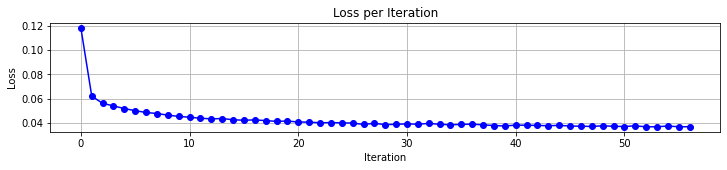

In [257]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

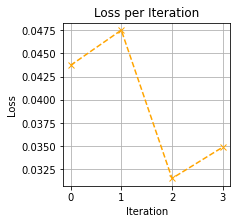

In [258]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

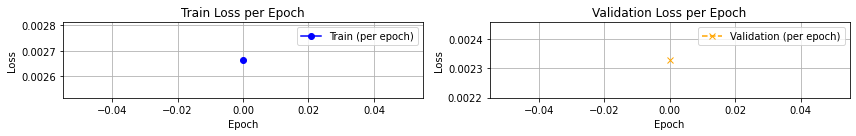

In [259]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [260]:
!pwd

/root/moanet_weight/random


In [261]:
%cd {root}/moanet_weight/random

/root/moanet_weight/random


In [262]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [263]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('moanet_random.pth'))

<All keys matched successfully>

In [264]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
len(test_loader)

6025

In [265]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  18%|█▊        | 1061/6025 [00:03<00:15, 323.00it/s]

train loss : 0.03830648239282891


Evaluating:  34%|███▍      | 2036/6025 [00:06<00:12, 326.52it/s]

train loss : 0.03544492121273652


Evaluating:  51%|█████     | 3052/6025 [00:09<00:09, 319.21it/s]

train loss : 0.03671309980959631


Evaluating:  67%|██████▋   | 4048/6025 [00:12<00:06, 320.75it/s]

train loss : 0.02611646603886038


Evaluating:  84%|████████▎ | 5042/6025 [00:15<00:03, 318.92it/s]

train loss : 0.02556425957311876


Evaluating: 100%|█████████▉| 6024/6025 [00:18<00:00, 318.04it/s]

train loss : 0.023760078547522427


Evaluating: 100%|██████████| 6025/6025 [00:19<00:00, 307.45it/s]


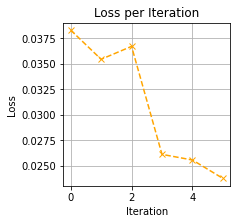

In [266]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [267]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)

        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)

        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [268]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [269]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    (X_test,prob), y_test = next(test_iter)

In [270]:
prob.shape

torch.Size([16, 11])

In [271]:
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda(),prob.cuda()).cpu().detach()).numpy() * 500 - 500

In [272]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

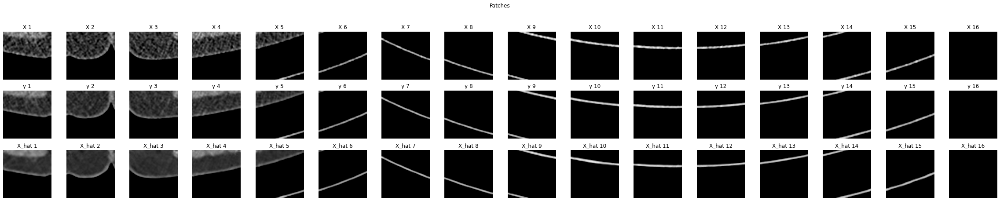

In [273]:
visualize_patches_total(X, y, X_hat)

In [274]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(X_hat.cpu().numpy()) * 500 - 500

In [275]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

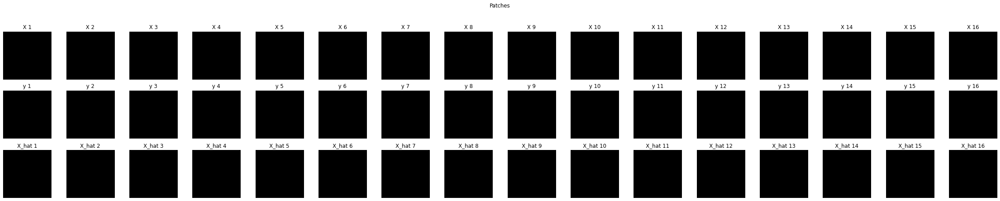

In [276]:
visualize_patches_total(X, y, X_hat)

In [277]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(X_hat.cpu().numpy()) * 500 - 500

In [278]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

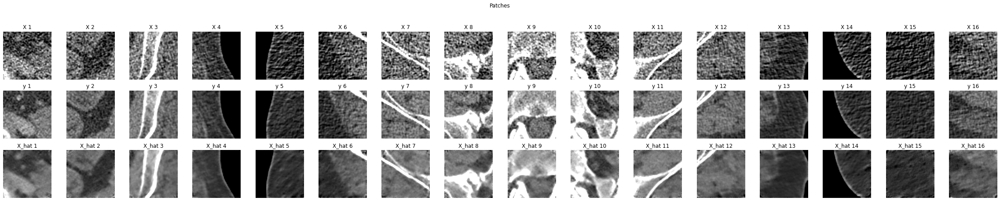

In [279]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [280]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('moanet_random.pth'))

<All keys matched successfully>

In [281]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=4, pin_memory=True)
len(test_loader)

1190

In [282]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, prob, y = data[0][0].to(device), data[0][1].to(device), data[1].to(device)
        X_hat = model(X, prob)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  85%|████████▍ | 1008/1190 [00:15<00:02, 63.03it/s]

train loss : 0.1639180977452779


Evaluating: 100%|██████████| 1190/1190 [00:19<00:00, 61.06it/s]


### 함수정의

In [283]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."

    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)

    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호

        # 패치를 해당 위치에 붙이기
        final_image[:,
                    row * patch_size:(row + 1) * patch_size,
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [284]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [285]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [286]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [287]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1857.))

In [288]:
!pwd

/root/moanet_weight/random


In [289]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)

    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)

    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

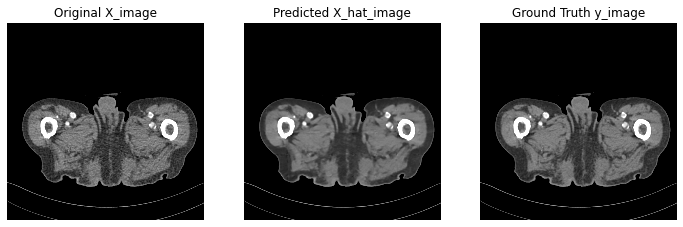

In [290]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [291]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

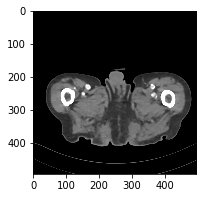

In [292]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

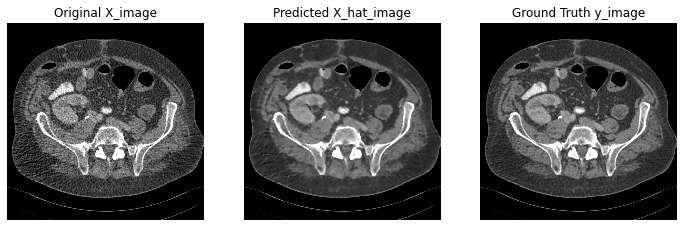

In [293]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [294]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [295]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

In [296]:
import torch
from PIL import Image
from urllib.request import urlopen
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

# 사용할 이미지
dicom_img = load_dicom_image(X_dir)
image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)
text_tokens = tokenizer(text_descriptions).to(device)

# 이미지 및 텍스트 전처리
image_input = preprocess(image).unsqueeze(0).to(device)
text_input = tokenizer(texts).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_tokens)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

In [297]:
prob.shape

torch.Size([81, 11])

In [298]:
logits.shape

torch.Size([1, 11])

In [299]:
X_patches.shape

torch.Size([81, 1, 55, 55])

In [300]:
expanded_logits = logits.expand(81, -1)  # shape: [81, 11]
expanded_logits.shape

torch.Size([81, 11])

In [301]:
X_hat = model(X_patches.cuda(),expanded_logits.cuda())
X_hat.shape

torch.Size([81, 1, 55, 55])

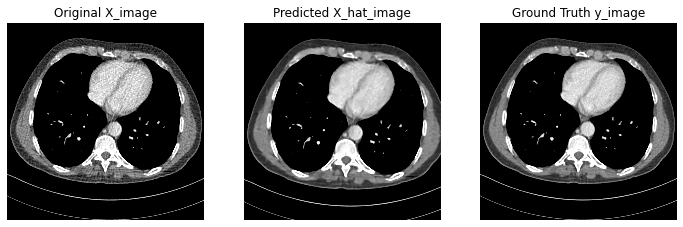

In [302]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_hat.detach().cpu()))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [303]:
!pwd

/root/moanet_weight/random


In [304]:
def recreat(X_dir):

    # X_patches
    X_img = normlize(X_dir)
    X_patches = extract_patches(torch.from_numpy(X_img))
    # prob
    dicom_img = load_dicom_image(X_dir)
    image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)
    text_tokens = tokenizer(text_descriptions).to(device)
    image_input = preprocess(image).unsqueeze(0).to(device)
    text_input = tokenizer(texts).to(device)
    with torch.no_grad():
        image_features, text_features, logit_scale = clip_model(image_input, text_tokens)
        logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)
    expanded_logits = logits.expand(81, -1)
    # X_hat
    X_hat = model(X_patches.cuda(),expanded_logits.cuda())

    return reconstruct_image(X_hat.detach().cpu())

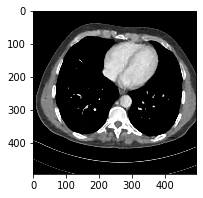

In [305]:
plt.imshow(rescale(np.squeeze(recreat(X_dir))), cmap='gray', vmin=-200, vmax=300)

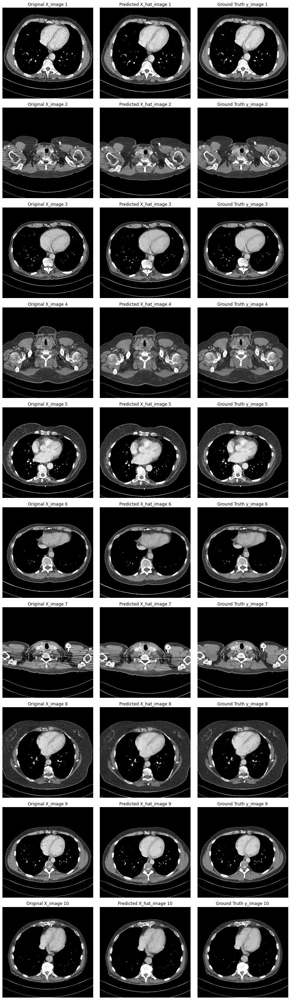

In [306]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'{root}/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    reconstructed_image = recreat(X_dir)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [307]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('moanet_random.pth'))
model.eval()

RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), 

## best / worst 이미지의 attention 확인

### 함수정의

In [308]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치

    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)

    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호

        # 패치를 해당 위치에 붙이기
        final_image[:,
                    row * patch_size:(row + 1) * patch_size,
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [309]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [310]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [311]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

### 1. best

In [312]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [313]:
reconstruct_image(X_test).shape

torch.Size([1, 495, 495])

In [314]:
import torch
import torch.nn.functional as F
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

image_tensor = reconstruct_image(X_test) # torch.Size([1, 495, 495])

# 텍스트
text_input = tokenizer(text_descriptions).to(device)

# Tensor를 BiomedCLIP이 처리할 수 있는 형태로 변환
def preprocess_tensor(img_tensor):
    # 1채널 → 3채널 (Grayscale → RGB)
    img_tensor = img_tensor.repeat(1, 3, 1, 1)  # (81, 1, 55, 55) → (81, 3, 55, 55)

    # 크기 조정 (55x55 → 224x224)
    img_tensor = F.interpolate(img_tensor, size=(224, 224), mode="bilinear", align_corners=False)

    return img_tensor

# 이미지 변환 후 BiomedCLIP 입력
image_input = preprocess_tensor(image_tensor).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

skull: 0.0007
ventricles: 0.5203
lungs: 0.4331
mediastinum: 0.0356
liver: 0.0001
kidneys: 0.0003
pancreas: 0.0000
spleen: 0.0067
abdominal aorta: 0.0028
spine: 0.0000
lymph nodes: 0.0002


In [315]:
logits_list = logits.squeeze(0)
logits_list.shape, logits_list.sum()

(torch.Size([11]), tensor(1.0000, device='cuda:0'))

In [316]:
# prob
expanded_logits = logits.expand(81, -1)
expanded_logits.shape

torch.Size([81, 11])

In [317]:
X_test.shape, expanded_logits.shape

(torch.Size([81, 1, 55, 55]), torch.Size([81, 11]))

In [318]:
X_test.to(device)
output = model(X_test.cuda(), expanded_logits.cuda())
output.shape

torch.Size([81, 1, 55, 55])

In [319]:
# Forward Pass
output = model(X_test, expanded_logits)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 11, 43, 43]), torch.Size([81, 11, 35, 35]))

여기서부터 시각화 확인

In [320]:
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_3.shape

torch.Size([81, 1, 43, 43])

In [321]:
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix3_img.shape

torch.Size([1, 387, 387])

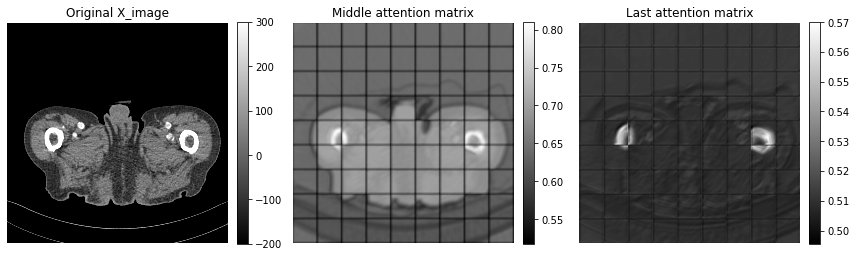

In [322]:
# 0번째 장기에 대한 attention
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

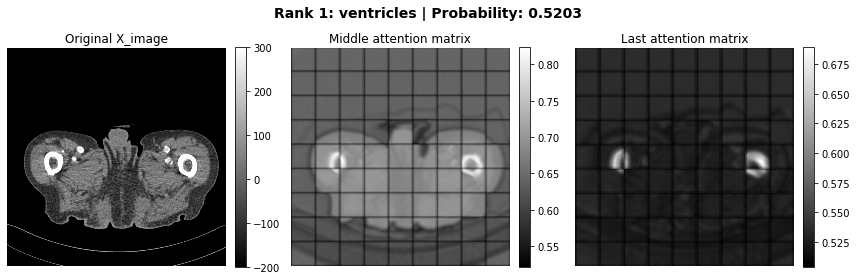

Saved: /root/output_images/random/best/rank_1_ventricles.png


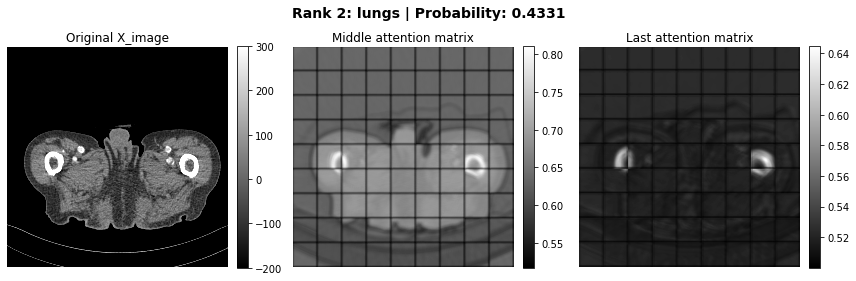

Saved: /root/output_images/random/best/rank_2_lungs.png


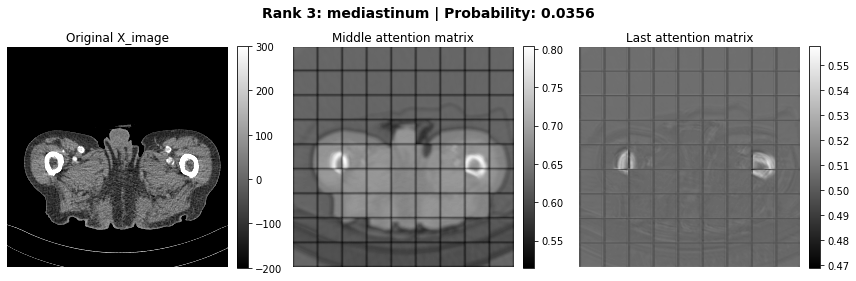

Saved: /root/output_images/random/best/rank_3_mediastinum.png


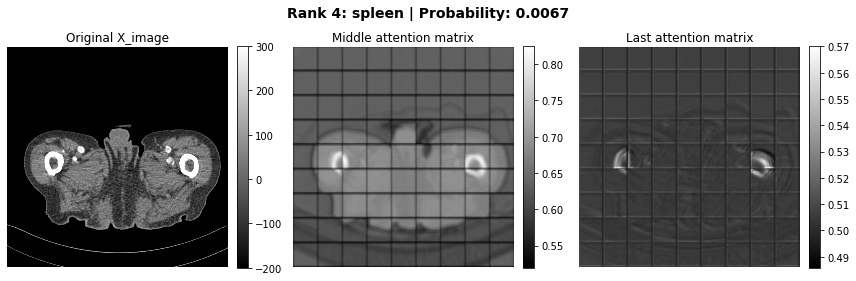

Saved: /root/output_images/random/best/rank_4_spleen.png


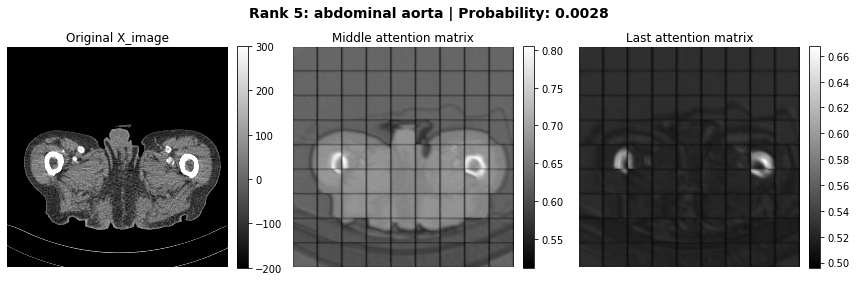

Saved: /root/output_images/random/best/rank_5_abdominal aorta.png


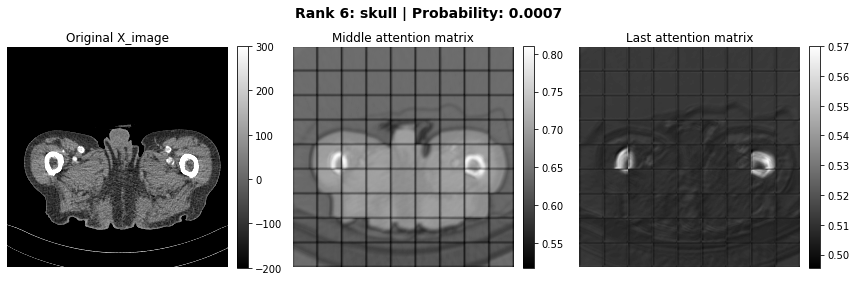

Saved: /root/output_images/random/best/rank_6_skull.png


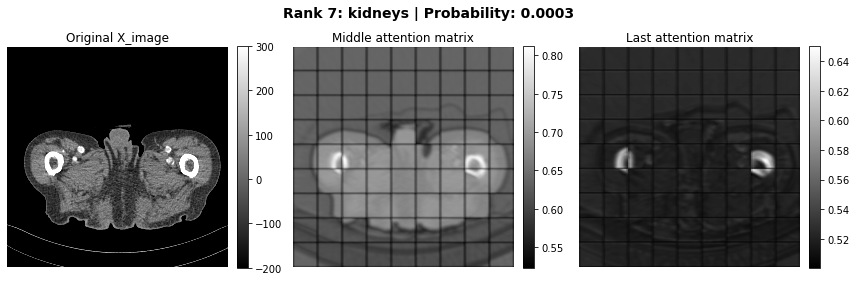

Saved: /root/output_images/random/best/rank_7_kidneys.png


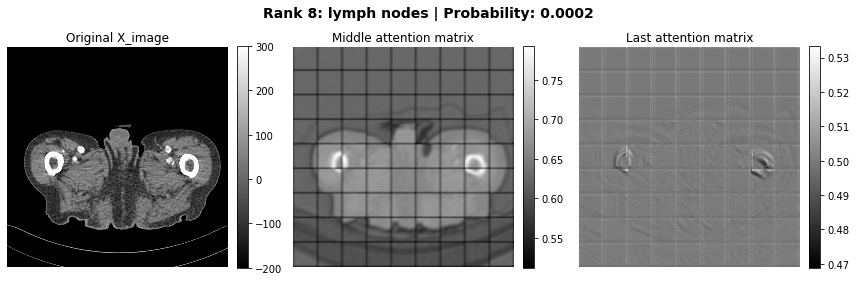

Saved: /root/output_images/random/best/rank_8_lymph nodes.png


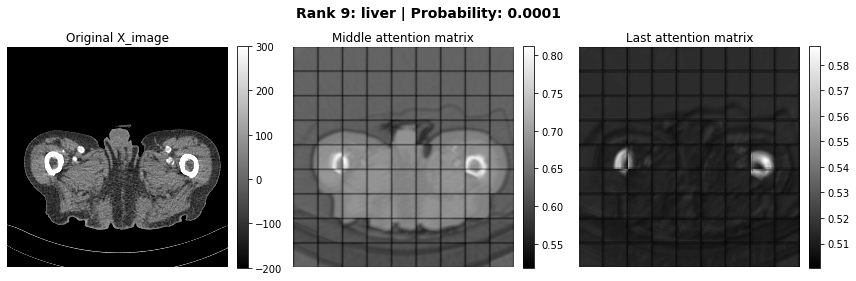

Saved: /root/output_images/random/best/rank_9_liver.png


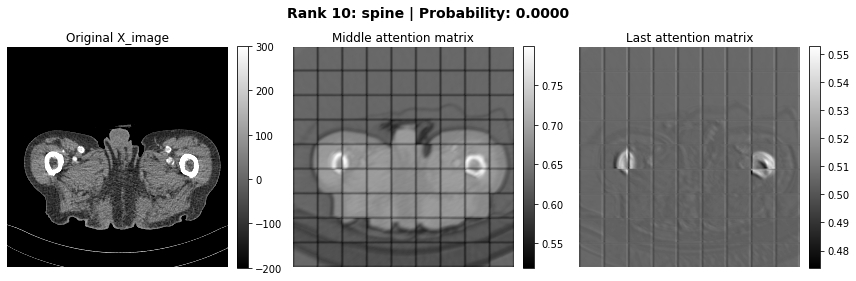

Saved: /root/output_images/random/best/rank_10_spine.png


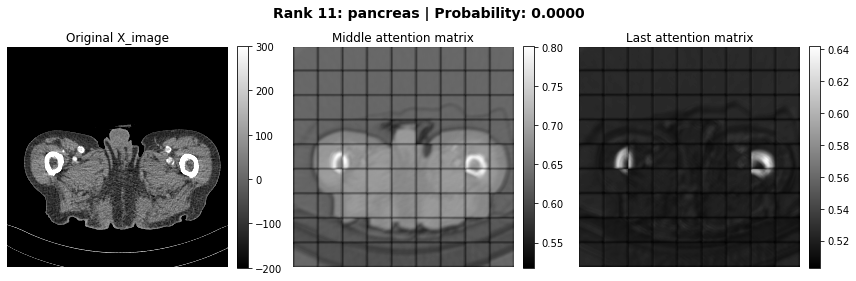

Saved: /root/output_images/random/best/rank_11_pancreas.png


In [323]:
import os

# 저장할 폴더 생성
save_dir = f"{root}/output_images/random/best"
os.makedirs(save_dir, exist_ok=True)

# 확률이 높은 순으로 정렬
sorted_indices = torch.argsort(logits_list, descending=True)  # 높은 확률 순으로 정렬
sorted_probs = logits_list[sorted_indices]  # 정렬된 확률값
sorted_organs = [text_descriptions[i] for i in sorted_indices]  # 정렬된 장기 이름

for rank, i in enumerate(sorted_indices):  # 정렬된 순서대로 반복
    selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
    selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)

    att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
    att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

    organ_name = sorted_organs[rank]  # 현재 장기 이름
    probability = sorted_probs[rank].item()  # 현재 장기에 대한 확률

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"Rank {rank+1}: {organ_name} | Probability: {probability:.4f}", fontsize=14, fontweight='bold')

    # 첫 번째 이미지
    im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
    axes[0].set_title("Original X_image")
    axes[0].axis('off')
    fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

    # 두 번째 이미지
    im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
    axes[1].set_title(f"Middle attention matrix")
    axes[1].axis('off')
    fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

    # 세 번째 이미지
    im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
    axes[2].set_title(f"Last attention matrix")
    axes[2].axis('off')
    fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()

    # 이미지 저장
    save_path = os.path.join(save_dir, f"rank_{rank+1}_{organ_name}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved: {save_path}")

### 2. worst

In [324]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [325]:
reconstruct_image(X_test).shape

torch.Size([1, 495, 495])

In [326]:
import torch
import torch.nn.functional as F
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
clip_model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
clip_model.to(device)
clip_model.eval()

image_tensor = reconstruct_image(X_test) # torch.Size([1, 495, 495])

# 텍스트
text_input = tokenizer(text_descriptions).to(device)

# Tensor를 BiomedCLIP이 처리할 수 있는 형태로 변환
def preprocess_tensor(img_tensor):
    # 1채널 → 3채널 (Grayscale → RGB)
    img_tensor = img_tensor.repeat(1, 3, 1, 1)  # (81, 1, 55, 55) → (81, 3, 55, 55)

    # 크기 조정 (55x55 → 224x224)
    img_tensor = F.interpolate(img_tensor, size=(224, 224), mode="bilinear", align_corners=False)

    return img_tensor

# 이미지 변환 후 BiomedCLIP 입력
image_input = preprocess_tensor(image_tensor).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = clip_model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

skull: 0.0032
ventricles: 0.0225
lungs: 0.0024
mediastinum: 0.1097
liver: 0.0001
kidneys: 0.0114
pancreas: 0.0000
spleen: 0.0034
abdominal aorta: 0.0054
spine: 0.8415
lymph nodes: 0.0003


In [327]:
logits_list = logits.squeeze(0)
logits_list.shape, logits_list.sum()

(torch.Size([11]), tensor(1.0000, device='cuda:0'))

In [328]:
# prob
expanded_logits = logits.expand(81, -1)
expanded_logits.shape

torch.Size([81, 11])

In [329]:
X_test.shape, expanded_logits.shape

(torch.Size([81, 1, 55, 55]), torch.Size([81, 11]))

In [330]:
X_test.to(device)
output = model(X_test.cuda(), expanded_logits.cuda())
output.shape

torch.Size([81, 1, 55, 55])

In [331]:
# Forward Pass
output = model(X_test, expanded_logits)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 11, 43, 43]), torch.Size([81, 11, 35, 35]))

여기서부터 시각화 확인

In [332]:
i = 0
selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
selected_att_3.shape

torch.Size([81, 1, 43, 43])

In [333]:
att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
att_matrix3_img.shape

torch.Size([1, 387, 387])

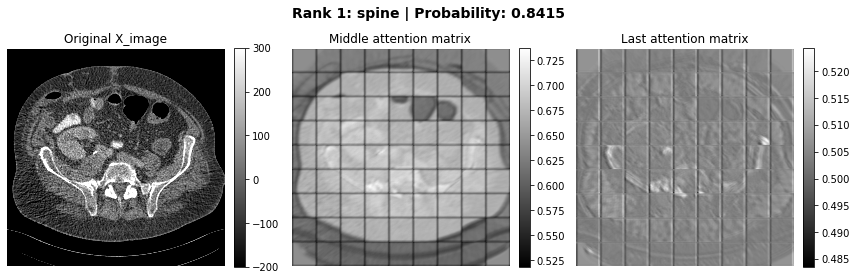

Saved: /root/output_images/random/worst/rank_1_spine.png


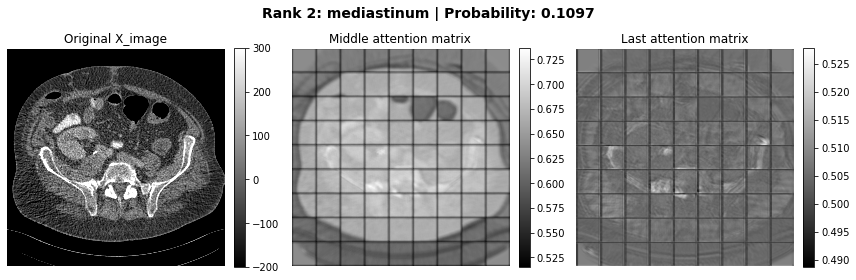

Saved: /root/output_images/random/worst/rank_2_mediastinum.png


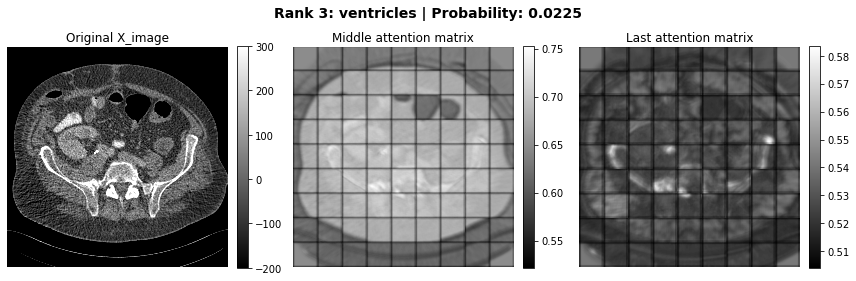

Saved: /root/output_images/random/worst/rank_3_ventricles.png


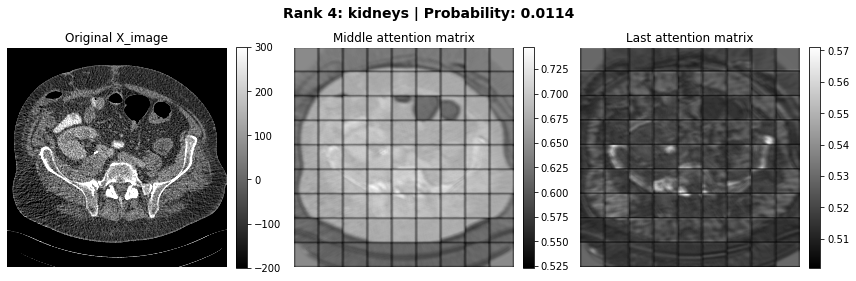

Saved: /root/output_images/random/worst/rank_4_kidneys.png


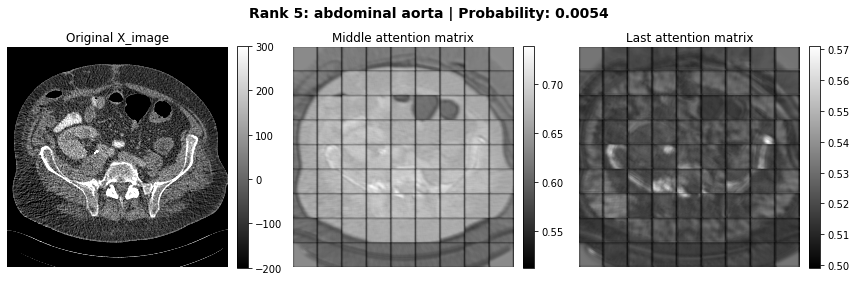

Saved: /root/output_images/random/worst/rank_5_abdominal aorta.png


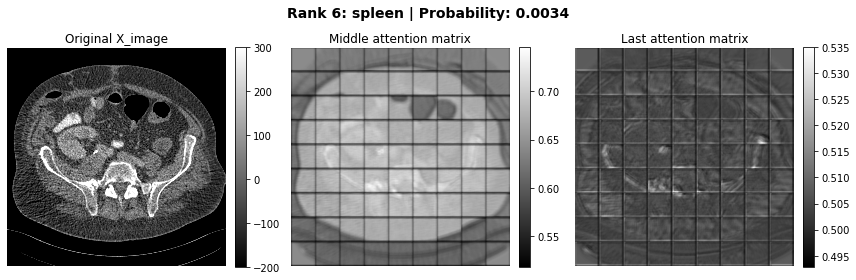

Saved: /root/output_images/random/worst/rank_6_spleen.png


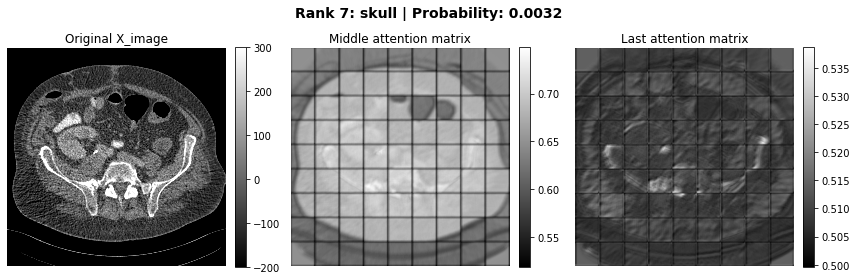

Saved: /root/output_images/random/worst/rank_7_skull.png


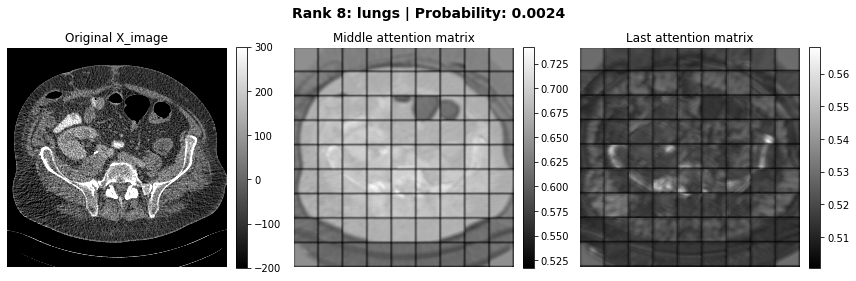

Saved: /root/output_images/random/worst/rank_8_lungs.png


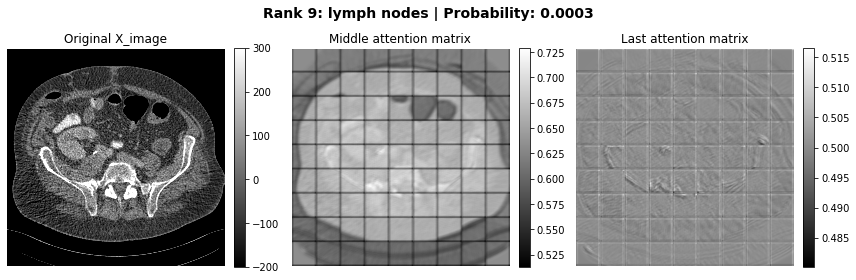

Saved: /root/output_images/random/worst/rank_9_lymph nodes.png


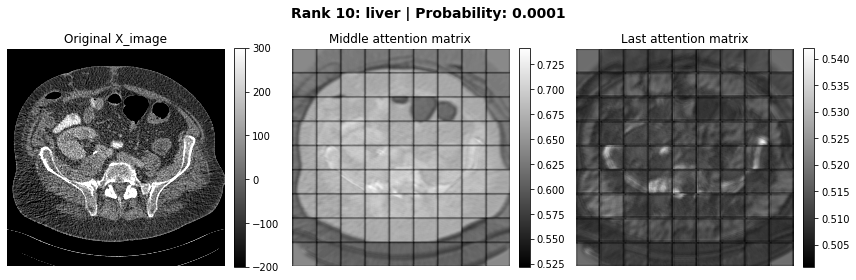

Saved: /root/output_images/random/worst/rank_10_liver.png


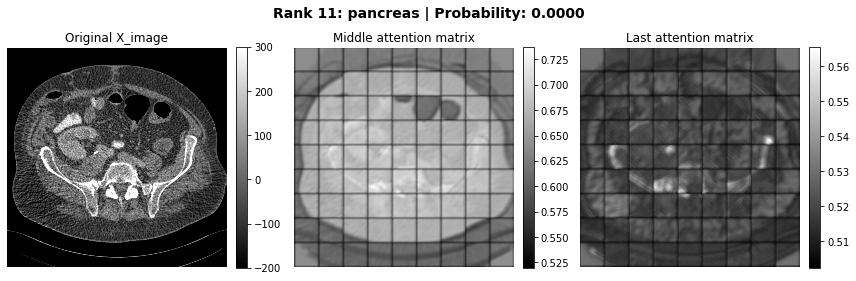

Saved: /root/output_images/random/worst/rank_11_pancreas.png


In [334]:
import os

# 저장할 폴더 생성
save_dir = f"{root}/output_images/random/worst"
os.makedirs(save_dir, exist_ok=True)

# 확률이 높은 순으로 정렬
sorted_indices = torch.argsort(logits_list, descending=True)  # 높은 확률 순으로 정렬
sorted_probs = logits_list[sorted_indices]  # 정렬된 확률값
sorted_organs = [text_descriptions[i] for i in sorted_indices]  # 정렬된 장기 이름

for rank, i in enumerate(sorted_indices):  # 정렬된 순서대로 반복
    selected_att_3 = att_matrix3[:, i, :, :].unsqueeze(1)
    selected_att_5 = att_matrix5[:, i, :, :].unsqueeze(1)

    att_matrix3_img = reconstruct_image(prediction=selected_att_3, patch_size=att_matrix3.shape[-1])
    att_matrix5_img = reconstruct_image(prediction=selected_att_5, patch_size=att_matrix5.shape[-1])

    organ_name = sorted_organs[rank]  # 현재 장기 이름
    probability = sorted_probs[rank].item()  # 현재 장기에 대한 확률

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"Rank {rank+1}: {organ_name} | Probability: {probability:.4f}", fontsize=14, fontweight='bold')

    # 첫 번째 이미지
    im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
    axes[0].set_title("Original X_image")
    axes[0].axis('off')
    fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

    # 두 번째 이미지
    im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
    axes[1].set_title(f"Middle attention matrix")
    axes[1].axis('off')
    fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

    # 세 번째 이미지
    im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
    axes[2].set_title(f"Last attention matrix")
    axes[2].axis('off')
    fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

    plt.tight_layout()

    # 이미지 저장
    save_path = os.path.join(save_dir, f"rank_{rank+1}_{organ_name}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved: {save_path}")